<a href="https://colab.research.google.com/github/Ayush310803/ViT/blob/main/Yolo11n_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import zipfile

os.environ["KAGGLE_CONFIG_DIR"] = "/content"
!kaggle datasets download -d rajkumarl/people-clothing-segmentation

dataset_zip = "/content/people-clothing-segmentation.zip"
extract_path = "/content/dataset"
os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset extracted successfully.")
!ls /content/dataset

Dataset URL: https://www.kaggle.com/datasets/rajkumarl/people-clothing-segmentation
License(s): CC0-1.0
100% 614M/616M [00:07<00:00, 58.3MB/s]
100% 616M/616M [00:07<00:00, 88.7MB/s]
✅ Dataset extracted successfully.
 jpeg_images   jpeg_masks  'labels (1).csv'   labels.csv   png_images   png_masks


In [2]:
import pandas as pd

label_path = "/content/dataset/labels.csv"
labels_df = pd.read_csv(label_path)

print(labels_df.head())
print("Column Names:", labels_df.columns.tolist())

   Unnamed: 0   label_list
0           0          NaN
1           1  accessories
2           2          bag
3           3         belt
4           4       blazer
Column Names: ['Unnamed: 0', 'label_list']


In [ ]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from PIL import Image

image_dir = "/content/dataset/jpeg_images/IMAGES"
mask_dir = "/content/dataset/jpeg_masks/MASKS"
label_path = "/content/dataset/labels.csv"

dataset_path = "/content/dataset_yolo"
os.makedirs(dataset_path, exist_ok=True)
os.makedirs(os.path.join(dataset_path, "images", "train"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "images", "val"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "labels", "train"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "labels", "val"), exist_ok=True)

labels_df = pd.read_csv(label_path)
labels_df["label_list"] = labels_df["label_list"].fillna("background")

train_df, val_df = train_test_split(labels_df, test_size=0.2, random_state=42)

def create_mask(mask_path, class_id):
    mask = np.zeros((512, 1024), dtype=np.uint8)
    mask[:, :] = class_id
    Image.fromarray(mask).save(mask_path)

def prepare_dataset(df, image_source, image_dest, label_dest):
    for _, row in df.iterrows():
        image_name = f"img_{row['Unnamed: 0']:04d}.jpeg"
        class_id = row["Unnamed: 0"]

        src_image_path = os.path.join(image_source, image_name)
        if not os.path.exists(src_image_path):
            print(f"Warning: Image {src_image_path} not found. Skipping.")
            continue

        shutil.copy(src_image_path, os.path.join(image_dest, image_name))

        mask_name = image_name.replace(".jpeg", ".png")
        mask_path = os.path.join(label_dest, mask_name)
        create_mask(mask_path, class_id)

prepare_dataset(train_df, image_dir,
                os.path.join(dataset_path, "images", "train"),
                os.path.join(dataset_path, "labels", "train"))

prepare_dataset(val_df, image_dir,
                os.path.join(dataset_path, "images", "val"),
                os.path.join(dataset_path, "labels", "val"))

print("✅ Dataset prepared successfully.")

✅ Dataset prepared successfully.


In [ ]:
yaml_content = """
train: /content/dataset_yolo/images/train
val: /content/dataset_yolo/images/val
nc: 10  # Number of classes
names: ['background', 'accessories', 'bag', 'belt', 'blazer', 'blouse', 'bodysuit', 'boots', 'bra', 'bracelet']
"""

yaml_path = "/content/clothing-segmentation.yaml"
with open(yaml_path, "w") as file:
    file.write(yaml_content)

print("✅ YAML file created successfully.")

✅ YAML file created successfully.


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n-seg.pt")
results = model.train(data=yaml_path, epochs=50, imgsz=640, batch=8)

print("✅ Training completed successfully.")

In [ ]:
metrics = model.val()
print("Validation Metrics:", metrics)

results = model.predict(source="/content/dataset_yolo/images/val", save=True)

In [ ]:
import os
import cv2
import numpy as np

val_images_dir = "/content/dataset_yolo/images/val"
val_masks_dir = "/content/dataset_yolo/labels/val"

val_images = sorted(os.listdir(val_images_dir))
val_masks = sorted(os.listdir(val_masks_dir))

print("Validation Images:", val_images[:5])
print("Validation Masks:", val_masks[:5])

In [ ]:
import matplotlib.pyplot as plt

def visualize_results(image_path, mask_path, model):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    results = model(image_path)

    if results[0].masks is not None:
        pred_mask = results[0].masks.data[0].cpu().numpy()
        pred_mask = (pred_mask * 255).astype(np.uint8)
    else:
        print(f"Warning: No masks found for image {image_path}. Skipping visualization.")
        return

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap="jet")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(gt_mask, cmap="jet")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.show()

for i in range(5):
    image_path = os.path.join(val_images_dir, val_images[i])
    mask_path = os.path.join(val_masks_dir, val_masks[i])
    visualize_results(image_path, mask_path, model)

In [4]:
import os
import cv2
import numpy as np

mask_dir = "/content/dataset/jpeg_masks/MASKS"
output_dir = "/content/dataset_yolo/labels"
os.makedirs(output_dir, exist_ok=True)

def convert_mask_to_yolo_format(mask_path, output_path, class_id=0):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    with open(output_path, "w") as file:
        for contour in contours:
            epsilon = 0.002 * cv2.arcLength(contour, True)
            polygon = cv2.approxPolyDP(contour, epsilon, True)

            polygon = polygon.reshape(-1, 2)
            polygon = polygon / np.array([mask.shape[1], mask.shape[0]])

            file.write(f"{class_id} ")
            file.write(" ".join([f"{x:.6f} {y:.6f}" for x, y in polygon]))
            file.write("\n")

for mask_name in os.listdir(mask_dir):
    if mask_name.endswith(".jpeg"):
        mask_path = os.path.join(mask_dir, mask_name)
        output_path = os.path.join(output_dir, mask_name.replace(".jpeg", ".txt"))
        convert_mask_to_yolo_format(mask_path, output_path)
        print(f"✅ Converted {mask_name} to YOLOv8 format.")

print("🎉 All masks converted successfully.")

✅ Converted seg_0233.jpeg to YOLOv8 format.
✅ Converted seg_0973.jpeg to YOLOv8 format.
✅ Converted seg_0380.jpeg to YOLOv8 format.
✅ Converted seg_0818.jpeg to YOLOv8 format.
✅ Converted seg_0917.jpeg to YOLOv8 format.
✅ Converted seg_0105.jpeg to YOLOv8 format.
✅ Converted seg_0446.jpeg to YOLOv8 format.
✅ Converted seg_0822.jpeg to YOLOv8 format.
✅ Converted seg_0226.jpeg to YOLOv8 format.
✅ Converted seg_0503.jpeg to YOLOv8 format.
✅ Converted seg_0400.jpeg to YOLOv8 format.
✅ Converted seg_0536.jpeg to YOLOv8 format.
✅ Converted seg_0253.jpeg to YOLOv8 format.
✅ Converted seg_0680.jpeg to YOLOv8 format.
✅ Converted seg_0672.jpeg to YOLOv8 format.
✅ Converted seg_0678.jpeg to YOLOv8 format.
✅ Converted seg_0098.jpeg to YOLOv8 format.
✅ Converted seg_0349.jpeg to YOLOv8 format.
✅ Converted seg_0689.jpeg to YOLOv8 format.
✅ Converted seg_0963.jpeg to YOLOv8 format.
✅ Converted seg_0039.jpeg to YOLOv8 format.
✅ Converted seg_0483.jpeg to YOLOv8 format.
✅ Converted seg_0395.jpeg to YOL

In [5]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

image_dir = "/content/dataset/jpeg_images/IMAGES"
mask_dir = "/content/dataset_yolo/labels"
label_path = "/content/dataset/labels.csv"

dataset_path = "/content/dataset_yolo"
os.makedirs(dataset_path, exist_ok=True)
os.makedirs(os.path.join(dataset_path, "images", "train"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "images", "val"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "labels", "train"), exist_ok=True)
os.makedirs(os.path.join(dataset_path, "labels", "val"), exist_ok=True)

labels_df = pd.read_csv(label_path)
labels_df["label_list"] = labels_df["label_list"].fillna("background")

train_df, val_df = train_test_split(labels_df, test_size=0.2, random_state=42)

def prepare_dataset(df, image_source, mask_source, image_dest, label_dest):
    for _, row in df.iterrows():
        image_name = f"img_{row['Unnamed: 0']:04d}.jpeg"
        mask_name = f"seg_{row['Unnamed: 0']:04d}.txt"

        src_image_path = os.path.join(image_source, image_name)
        if not os.path.exists(src_image_path):
            print(f"Warning: Image {src_image_path} not found. Skipping.")
            continue
        shutil.copy(src_image_path, os.path.join(image_dest, image_name))

        src_mask_path = os.path.join(mask_source, mask_name)
        if not os.path.exists(src_mask_path):
            print(f"Warning: Mask {src_mask_path} not found. Skipping.")
            continue
        shutil.copy(src_mask_path, os.path.join(label_dest, mask_name))

prepare_dataset(train_df, image_dir, mask_dir,
                os.path.join(dataset_path, "images", "train"),
                os.path.join(dataset_path, "labels", "train"))

prepare_dataset(val_df, image_dir, mask_dir,
                os.path.join(dataset_path, "images", "val"),
                os.path.join(dataset_path, "labels", "val"))

print("✅ Dataset prepared successfully.")

✅ Dataset prepared successfully.


In [6]:
class_names = labels_df["label_list"].tolist()

yaml_content = f"""
train: /content/dataset_yolo/images/train
val: /content/dataset_yolo/images/val
nc: {len(class_names)}  # Number of classes
names: {class_names}  # List of class names
"""

yaml_path = "/content/clothing-segmentation.yaml"
with open(yaml_path, "w") as file:
    file.write(yaml_content)

print("✅ YAML file created successfully.")
print(yaml_content)

✅ YAML file created successfully.

train: /content/dataset_yolo/images/train
val: /content/dataset_yolo/images/val
nc: 59  # Number of classes
names: ['background', 'accessories', 'bag', 'belt', 'blazer', 'blouse', 'bodysuit', 'boots', 'bra', 'bracelet', 'cape', 'cardigan', 'clogs', 'coat', 'dress', 'earrings', 'flats', 'glasses', 'gloves', 'hair', 'hat', 'heels', 'hoodie', 'intimate', 'jacket', 'jeans', 'jumper', 'leggings', 'loafers', 'necklace', 'panties', 'pants', 'pumps', 'purse', 'ring', 'romper', 'sandals', 'scarf', 'shirt', 'shoes', 'shorts', 'skin', 'skirt', 'sneakers', 'socks', 'stockings', 'suit', 'sunglasses', 'sweater', 'sweatshirt', 'swimwear', 't-shirt', 'tie', 'tights', 'top', 'vest', 'wallet', 'watch', 'wedges']  # List of class names



In [7]:
from ultralytics import YOLO

model1 = YOLO("yolo11n-seg.pt")
results = model1.train(data=yaml_path, epochs=50, imgsz=640, batch=8, verbose=True)

print("✅ Training completed successfully.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.90M/5.90M [00:00<00:00, 134MB/s]


Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/clothing-segmentation.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

100%|██████████| 755k/755k [00:00<00:00, 19.8MB/s]


Overriding model.yaml nc=80 with nc=59

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 99.0MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset_yolo/labels/train... 0 images, 47 backgrounds, 0 corrupt: 100%|██████████| 47/47 [00:00<00:00, 3303.21it/s]

train: WARNING ⚠️ No labels found in /content/dataset_yolo/labels/train.cache. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
train: New cache created: /content/dataset_yolo/labels/train.cache
WARNING ⚠️ No labels found in /content/dataset_yolo/labels/train.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset_yolo/labels/val... 0 images, 11 backgrounds, 0 corrupt: 100%|██████████| 11/11 [00:00<00:00, 2867.28it/s]

val: WARNING ⚠️ No labels found in /content/dataset_yolo/labels/val.cache. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
val: New cache created: /content/dataset_yolo/labels/val.cache
WARNING ⚠️ No labels found in /content/dataset_yolo/labels/val.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.


Plotting labels to runs/segment/train/labels.jpg... 
zero-size array to reduction operation maximum which has no identity
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000159, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.48G          0          0      63.52          0          0        640: 100%|██████████| 6/6 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


RuntimeError: torch.cat(): expected a non-empty list of Tensors

In [12]:
val_images_dir = "/content/dataset_yolo/images/val"
val_masks_dir = "/content/dataset_yolo/labels/val"

val_images = os.listdir(val_images_dir)
val_masks = os.listdir(val_masks_dir)

print("Validation Images:", val_images[:10])
print("Validation Masks:", val_masks[:10])

Validation Images: ['img_0003.jpeg', 'img_0045.jpeg', 'img_0049.jpeg', 'img_0034.jpeg', 'img_0047.jpeg', 'img_0025.jpeg', 'img_0013.jpeg', 'img_0057.jpeg', 'img_0053.jpeg', 'img_0012.jpeg']
Validation Masks: ['seg_0012.txt', 'seg_0003.txt', 'seg_0053.txt', 'seg_0025.txt', 'seg_0057.txt', 'seg_0034.txt', 'seg_0045.txt', 'seg_0013.txt', 'seg_0005.txt', 'seg_0047.txt']


Visualizing seg_0233.jpeg


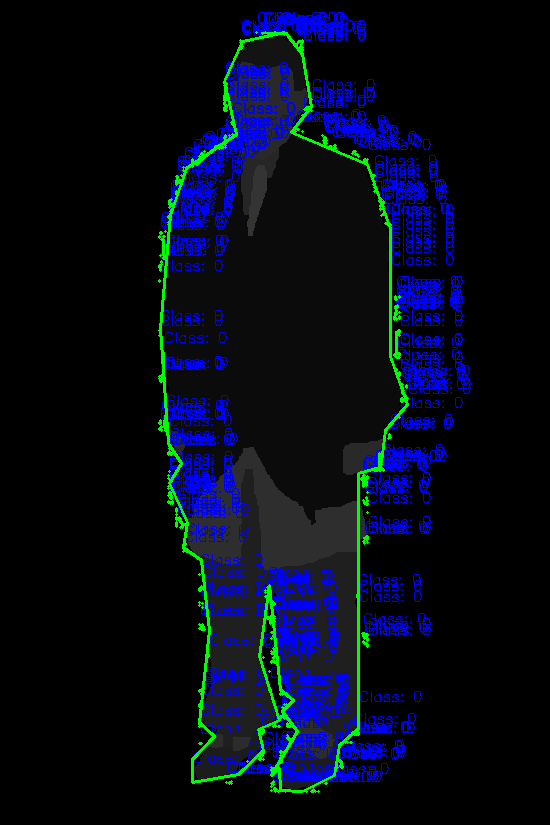

Visualizing seg_0973.jpeg


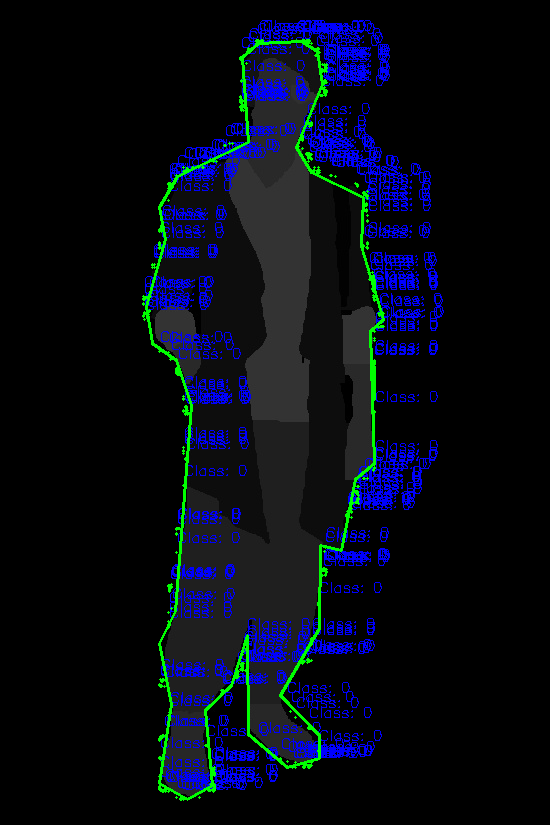

Visualizing seg_0380.jpeg


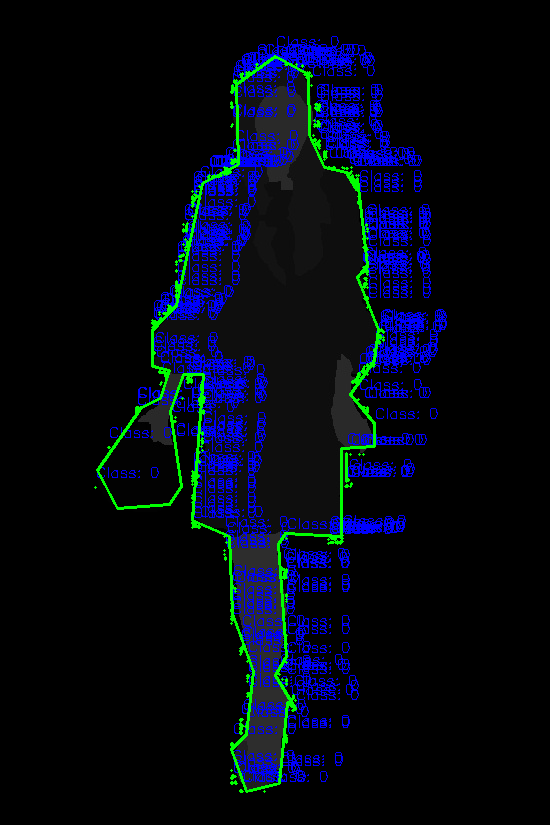

Visualizing seg_0818.jpeg


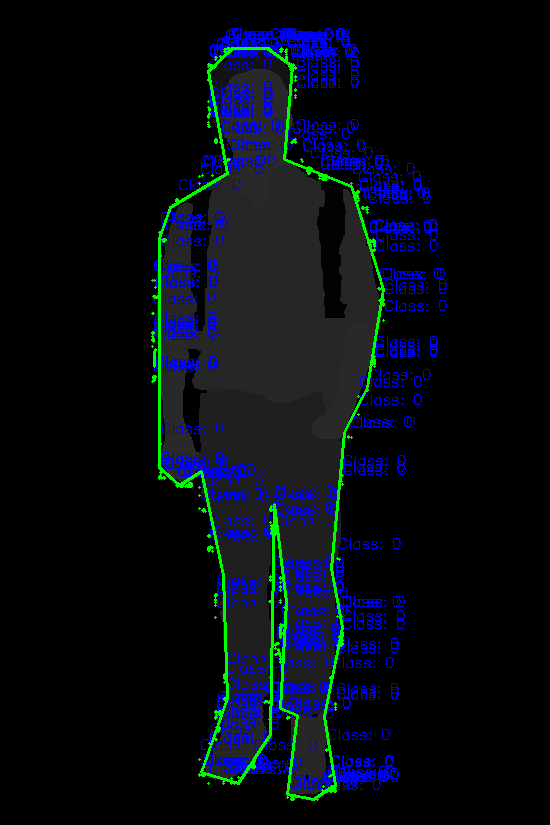

Visualizing seg_0917.jpeg


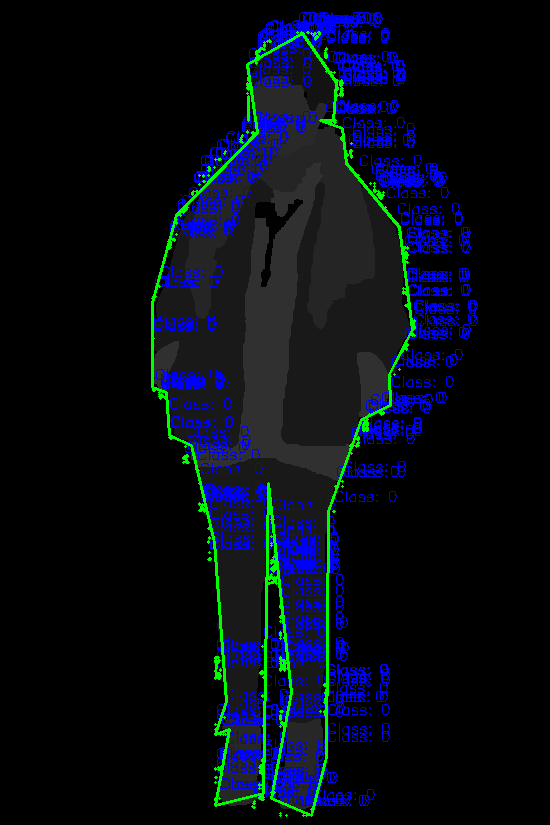

Visualizing seg_0105.jpeg


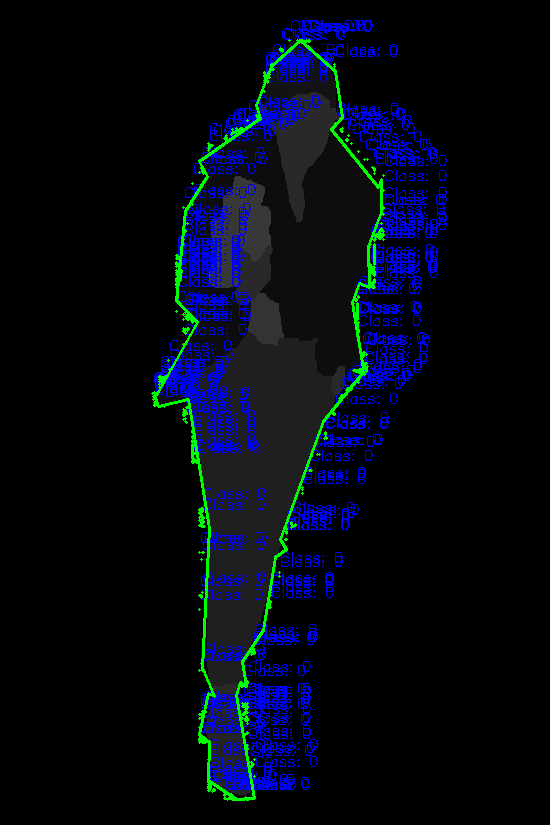

Visualizing seg_0446.jpeg


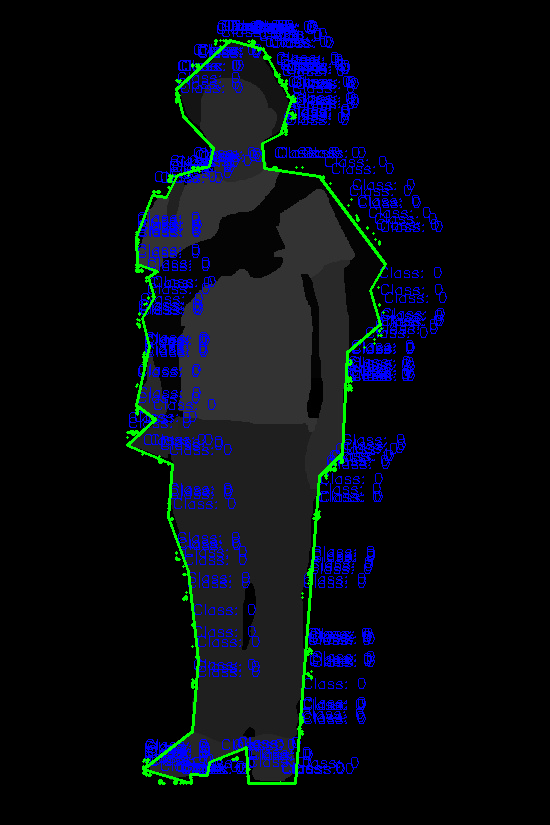

Visualizing seg_0822.jpeg


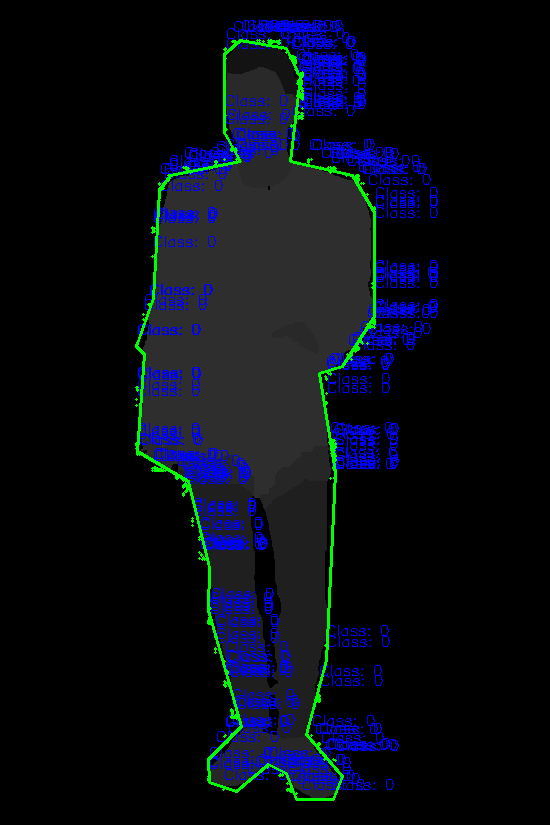

Visualizing seg_0226.jpeg


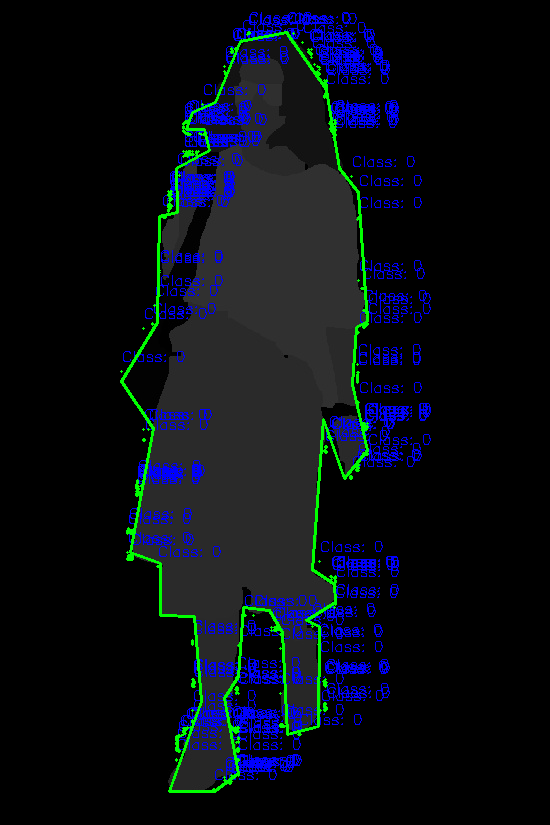

Visualizing seg_0503.jpeg


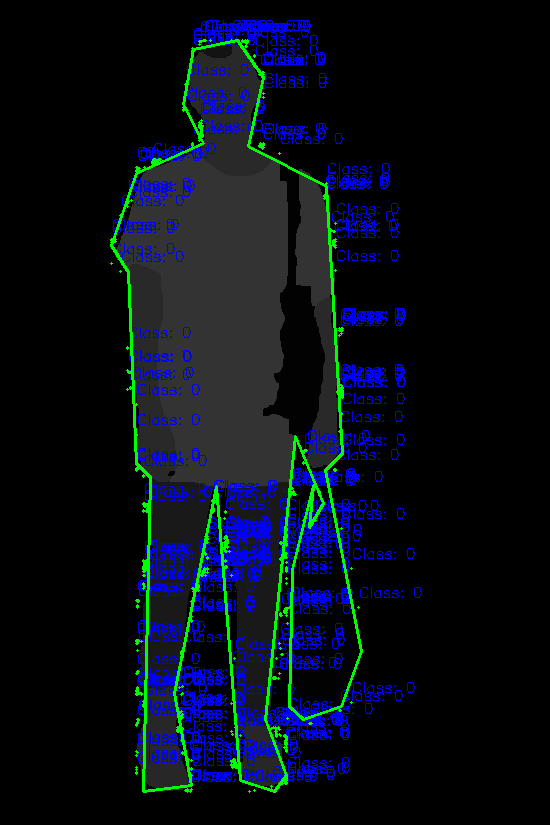

Visualizing seg_0400.jpeg


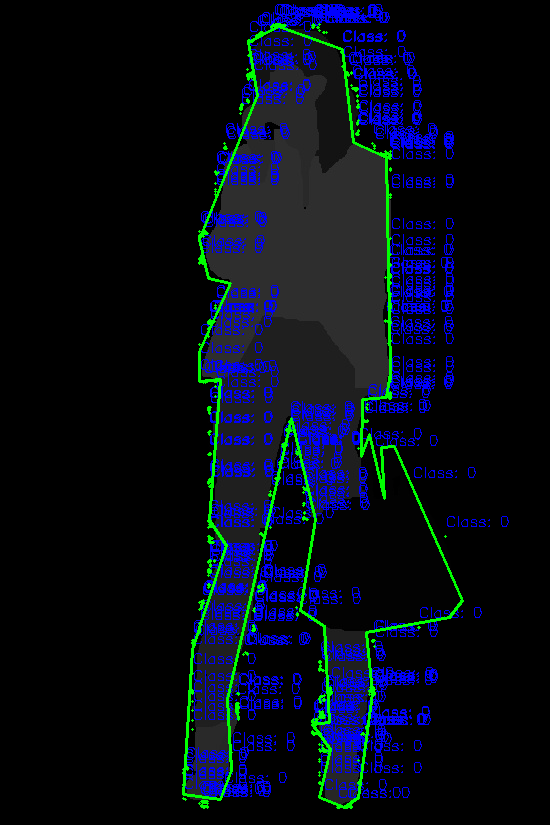

Visualizing seg_0536.jpeg


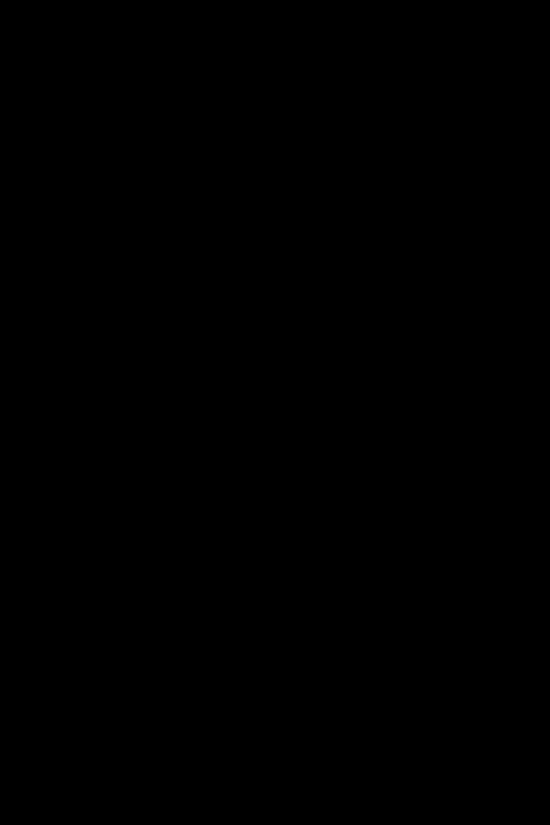

Visualizing seg_0253.jpeg


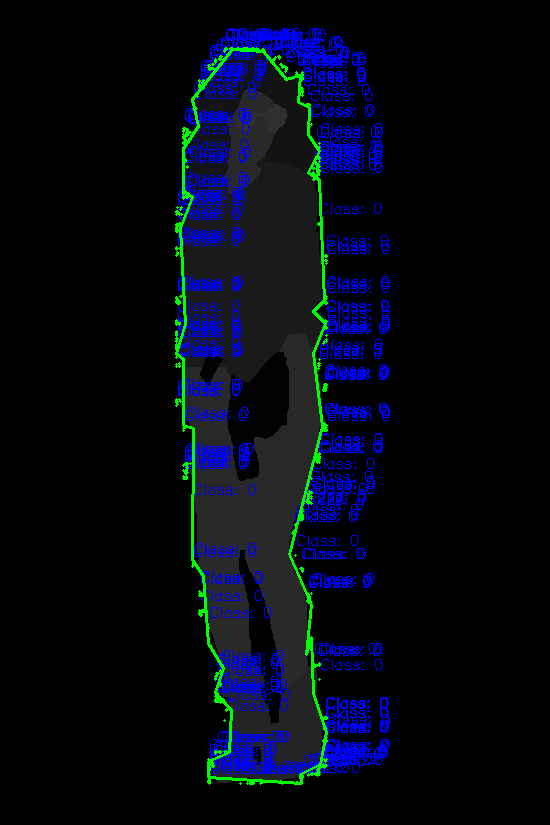

Visualizing seg_0680.jpeg


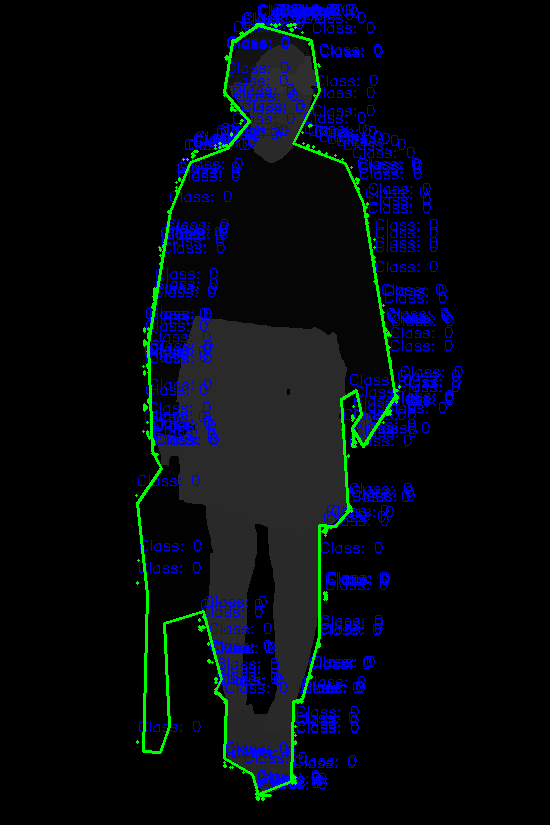

Visualizing seg_0672.jpeg


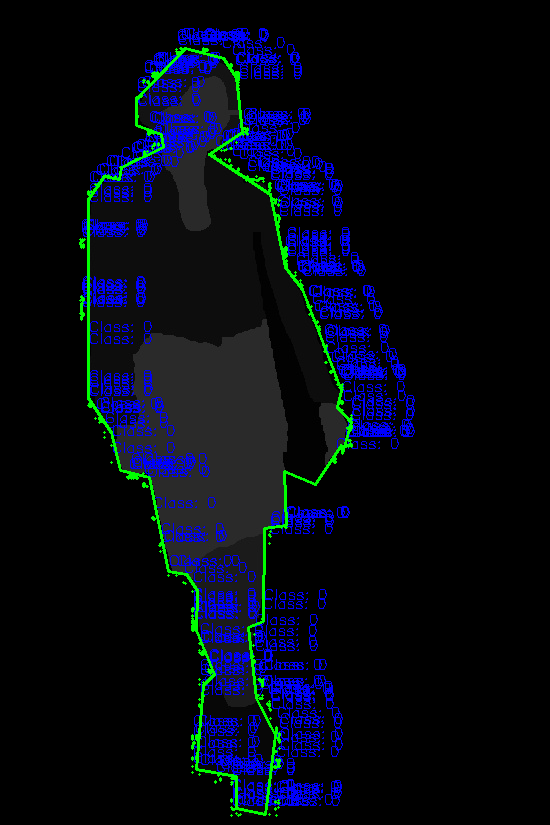

Visualizing seg_0678.jpeg


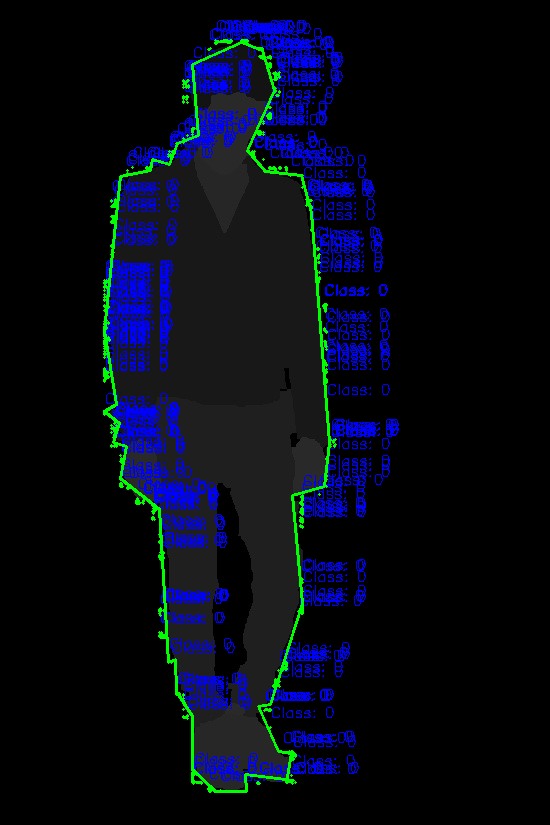

Visualizing seg_0098.jpeg


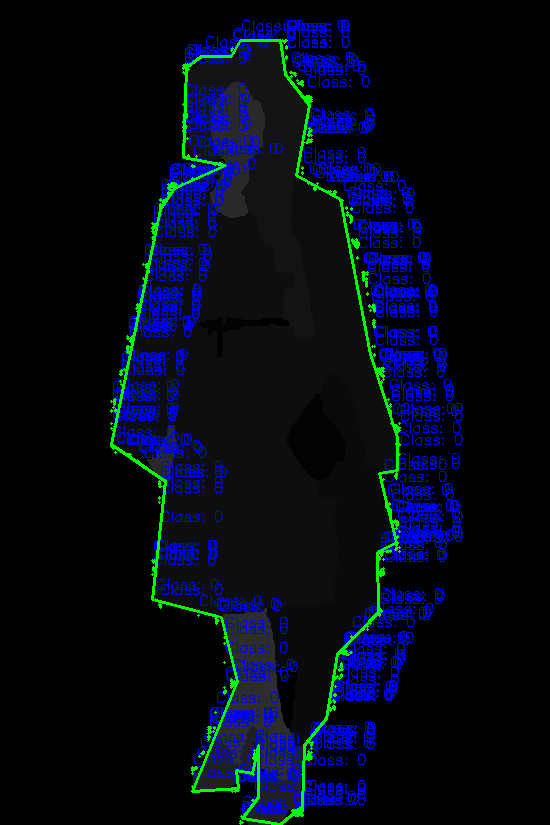

Visualizing seg_0349.jpeg


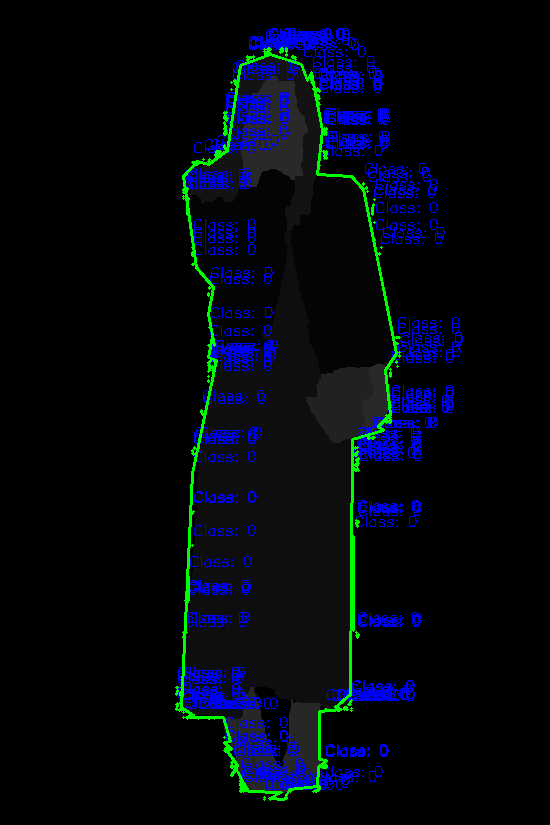

Visualizing seg_0689.jpeg


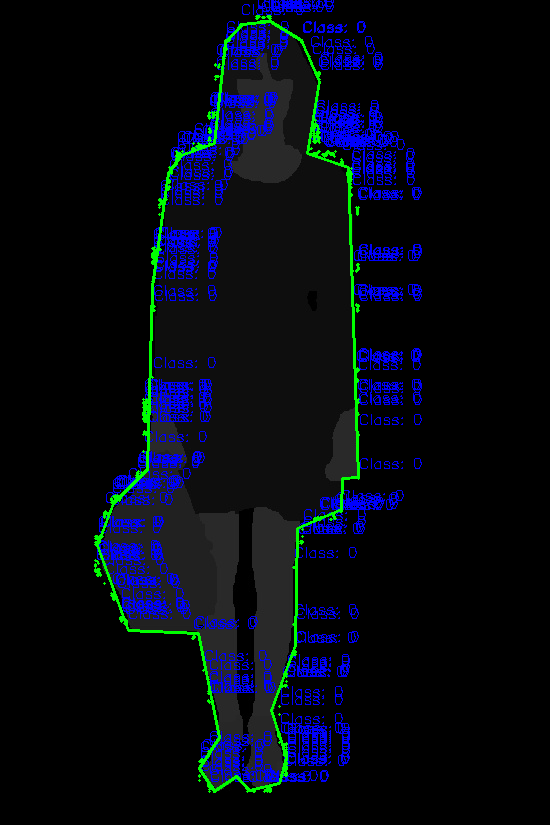

Visualizing seg_0963.jpeg


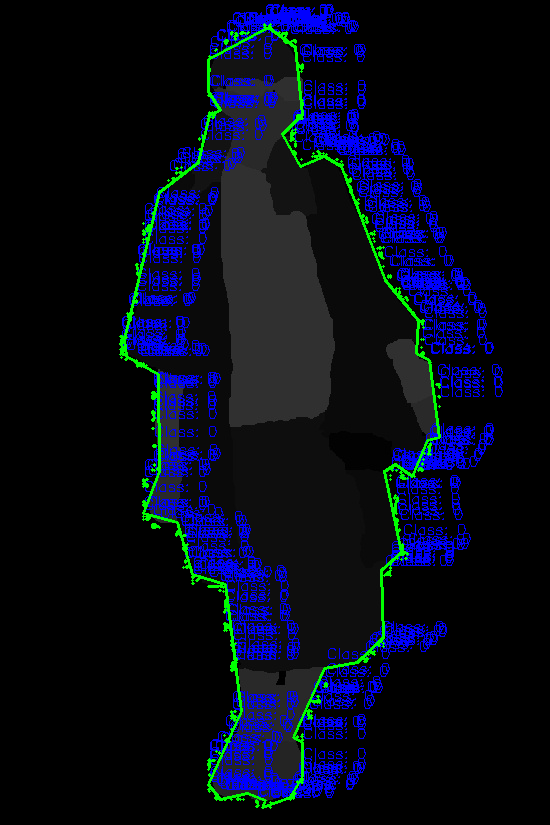

Visualizing seg_0039.jpeg


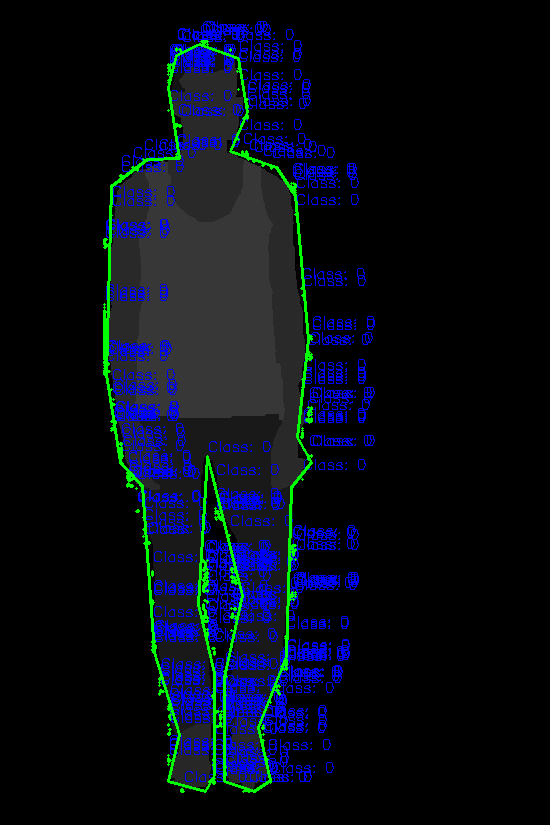

Visualizing seg_0483.jpeg


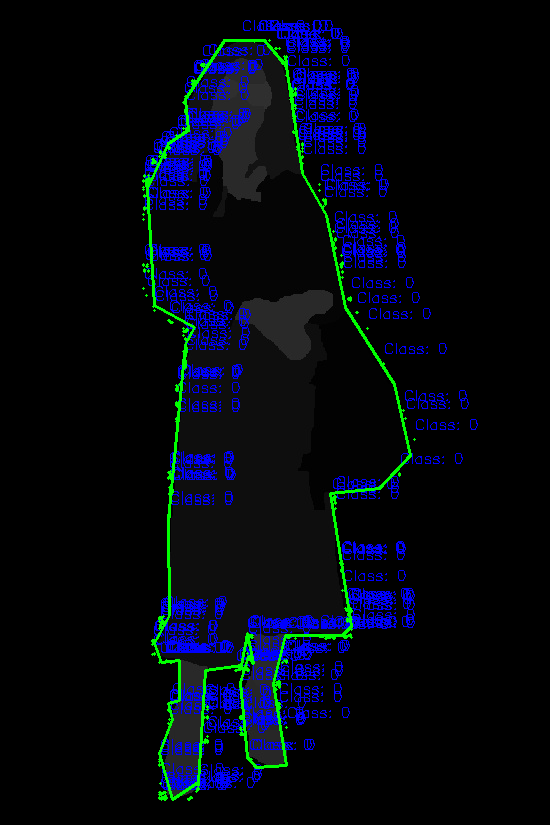

Visualizing seg_0395.jpeg


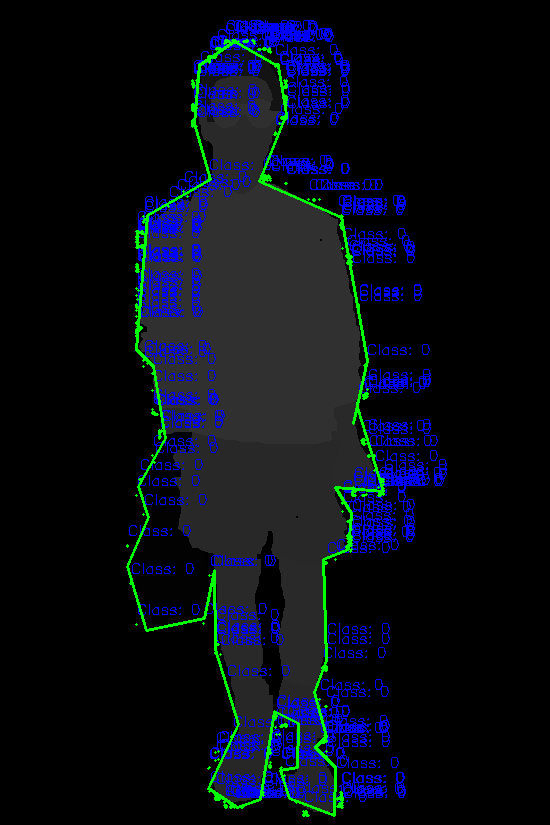

Visualizing seg_0560.jpeg


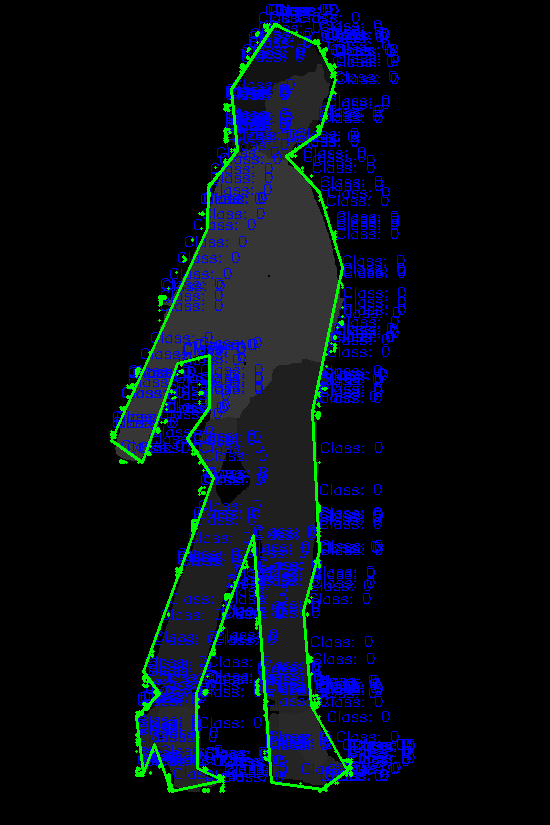

Visualizing seg_0254.jpeg


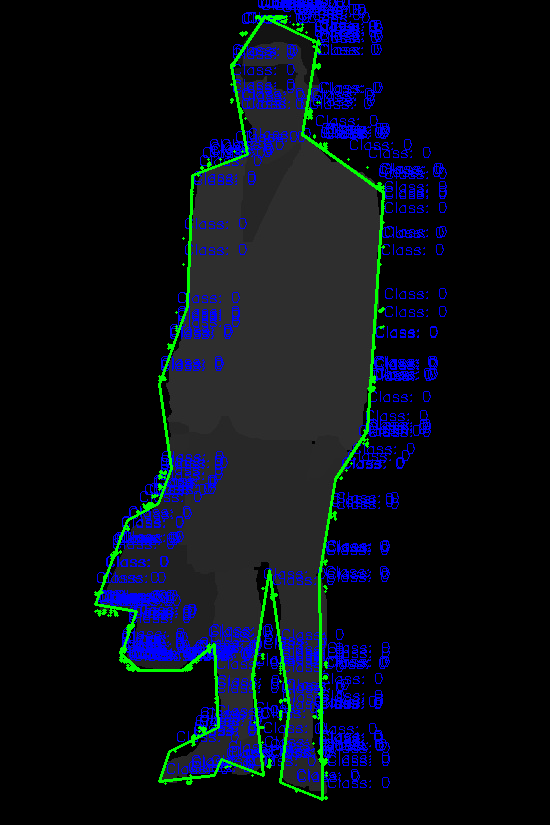

Visualizing seg_0527.jpeg


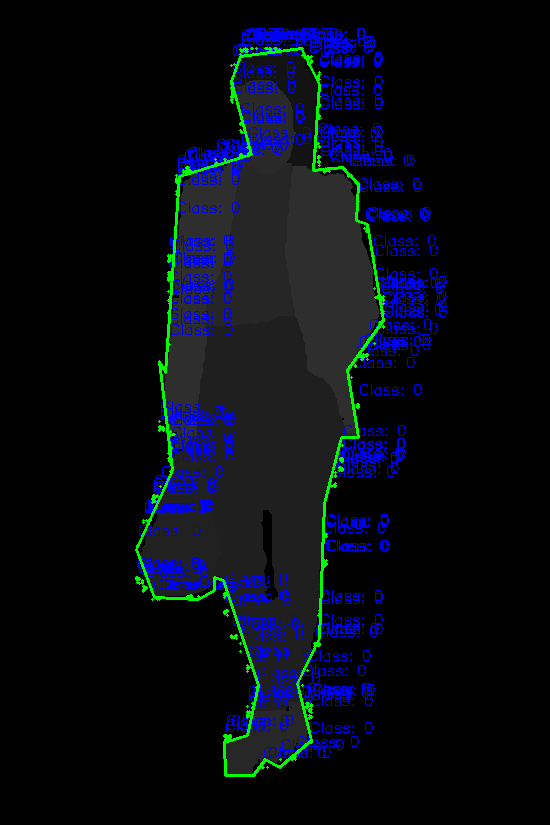

Visualizing seg_0107.jpeg


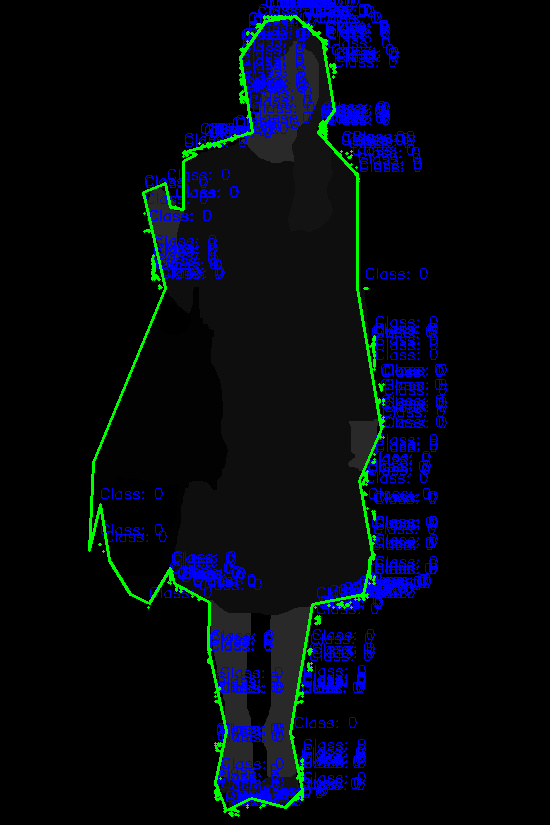

Visualizing seg_0820.jpeg


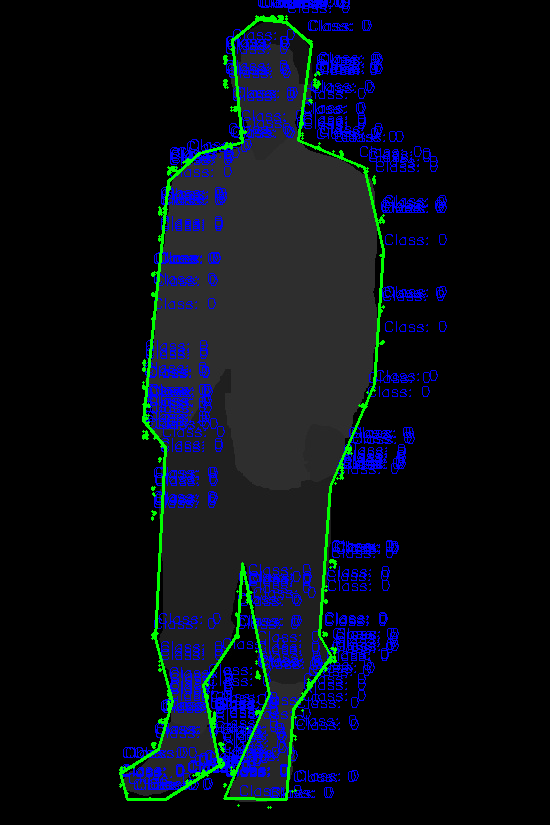

Visualizing seg_0102.jpeg


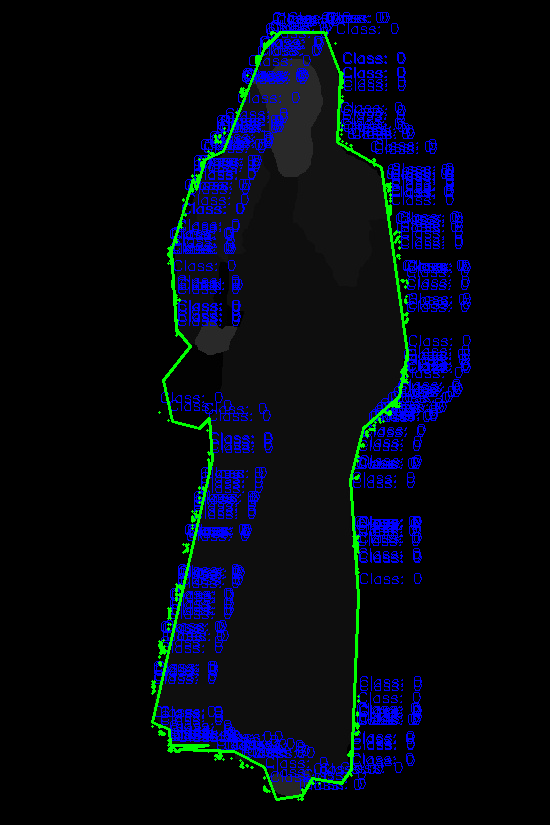

Visualizing seg_0212.jpeg


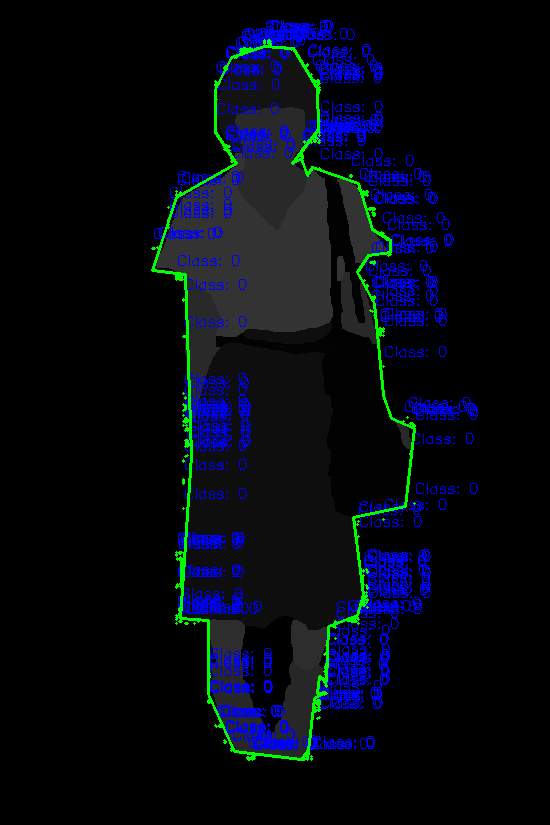

Visualizing seg_0787.jpeg


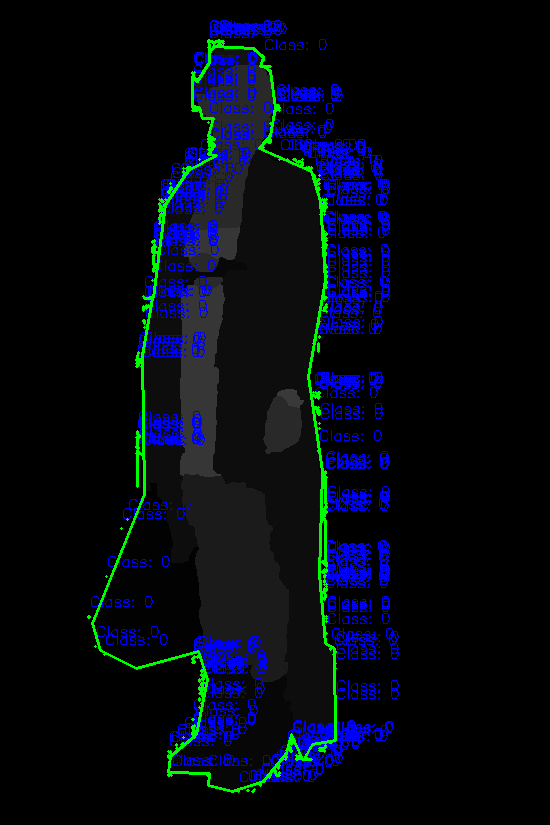

Visualizing seg_0342.jpeg


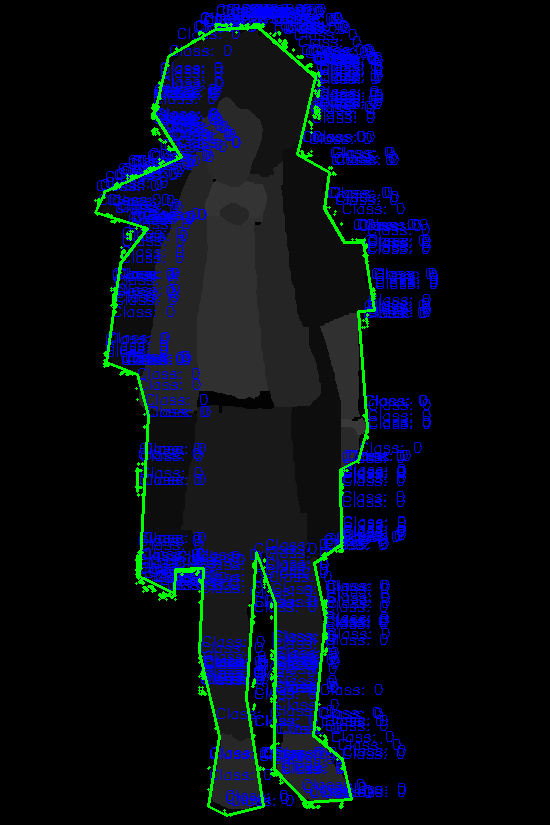

Visualizing seg_0954.jpeg


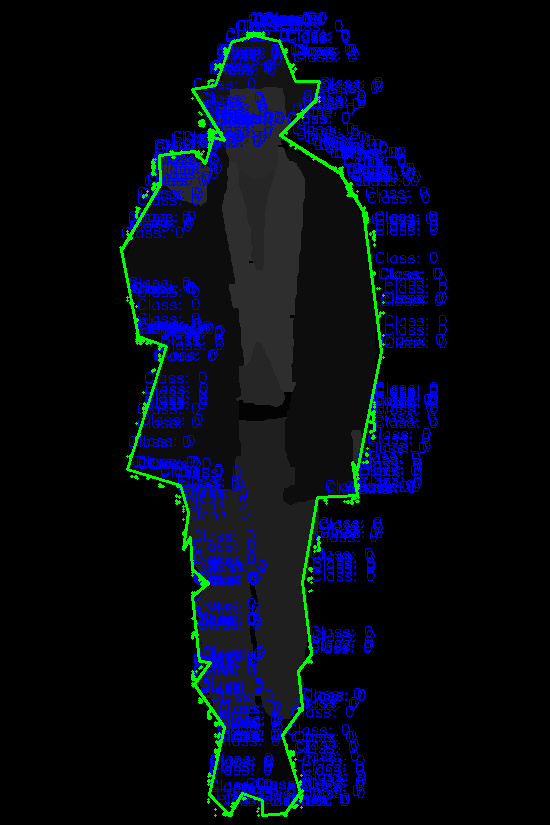

Visualizing seg_0051.jpeg


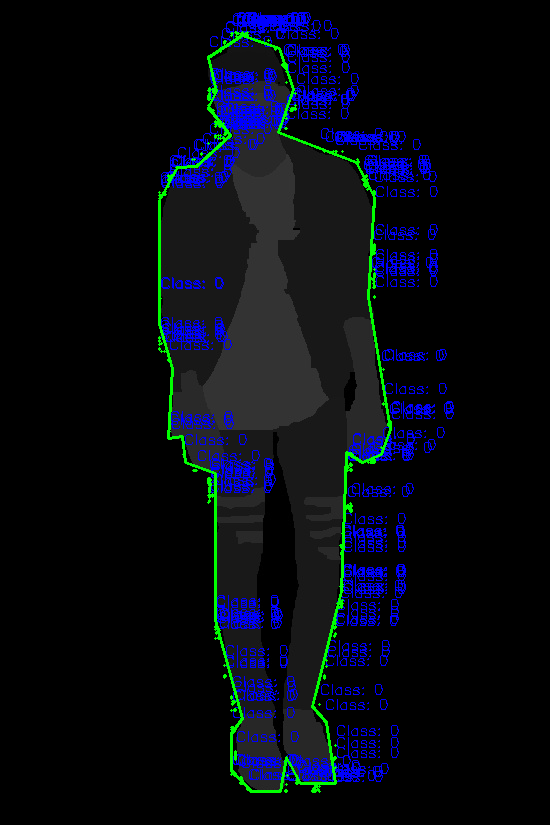

Visualizing seg_0066.jpeg


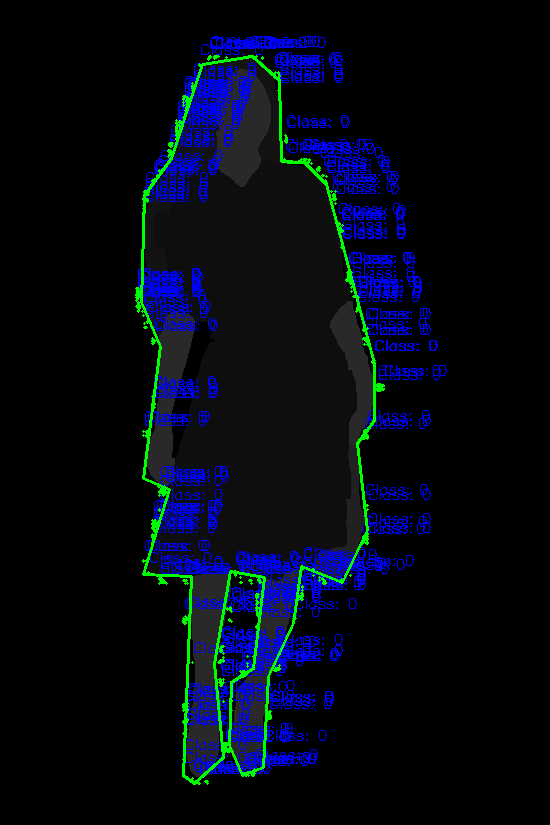

Visualizing seg_0705.jpeg


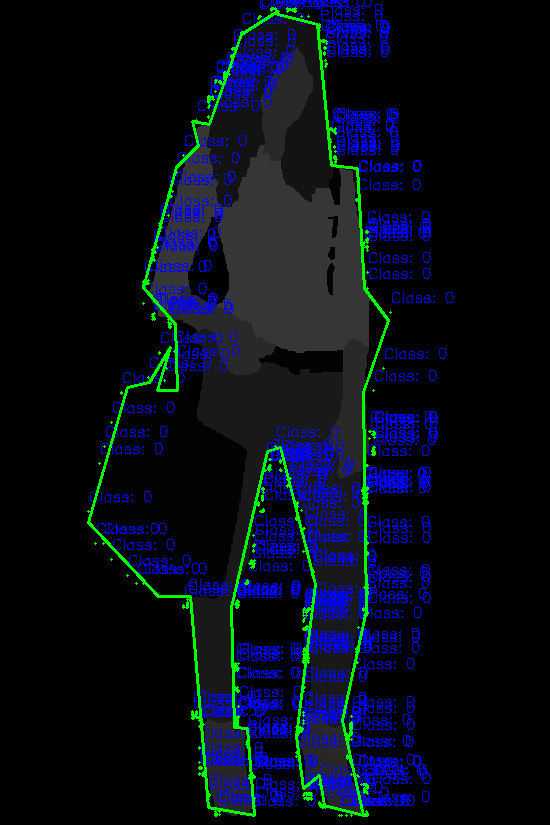

Visualizing seg_0714.jpeg


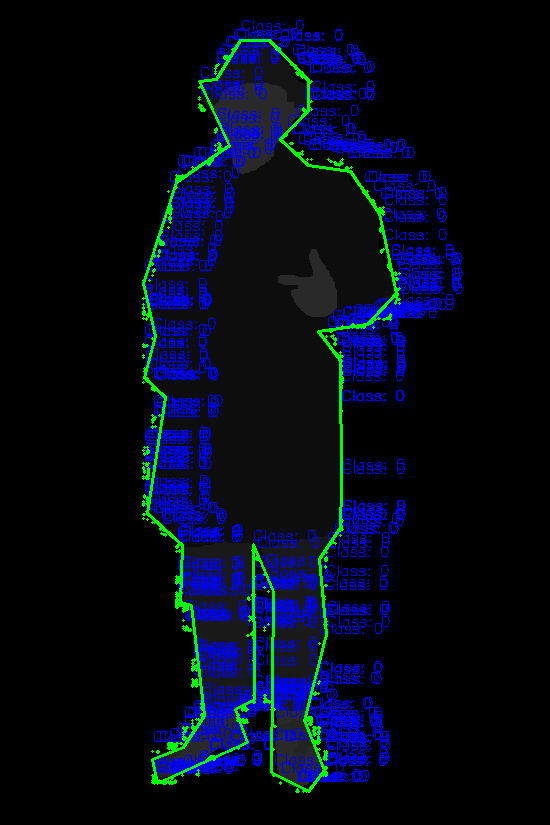

Visualizing seg_0727.jpeg


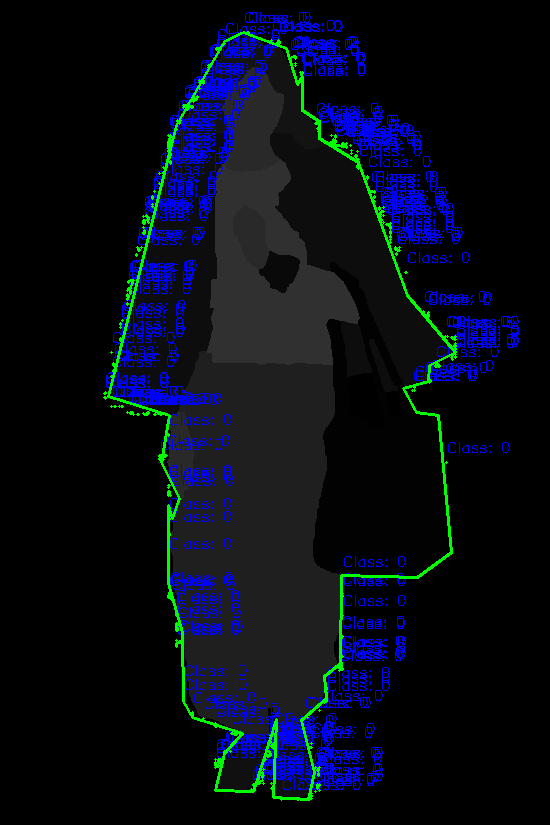

Visualizing seg_0368.jpeg


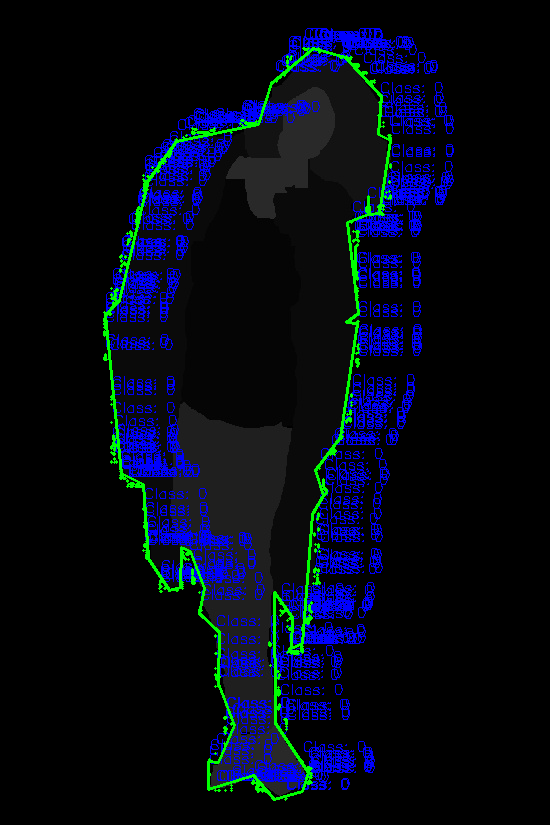

Visualizing seg_0442.jpeg


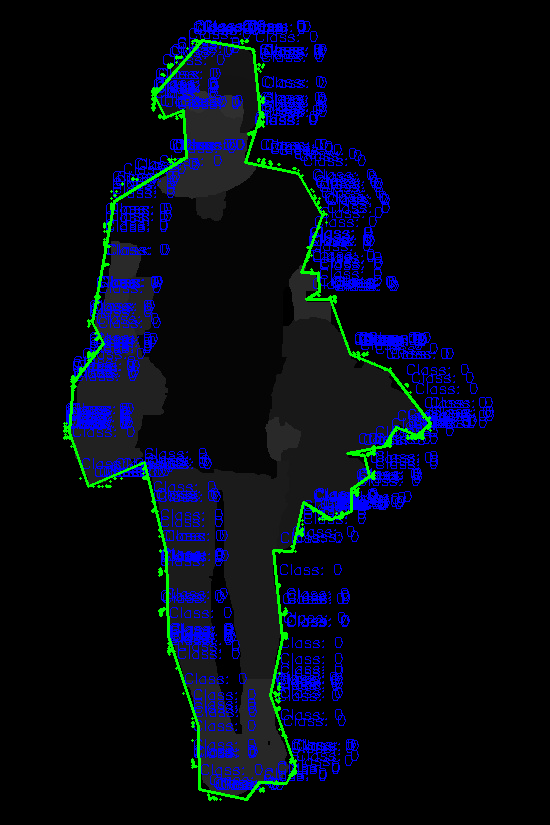

Visualizing seg_0416.jpeg


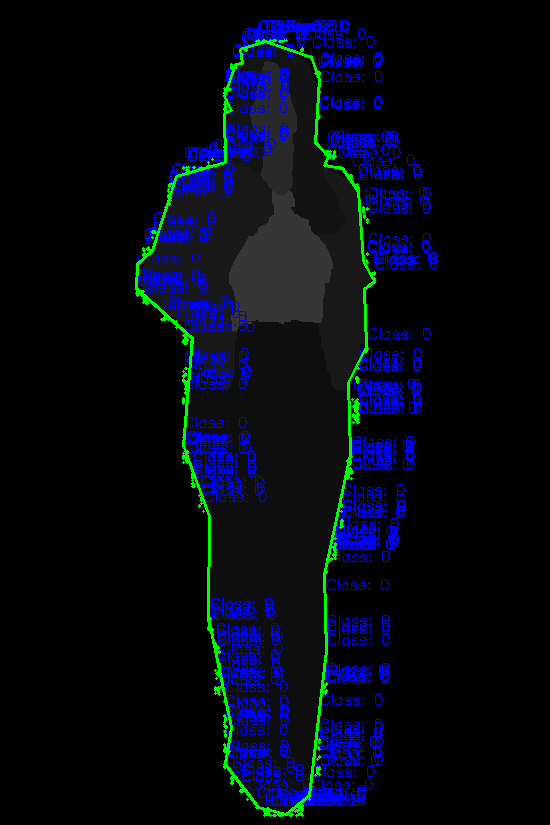

Visualizing seg_0243.jpeg


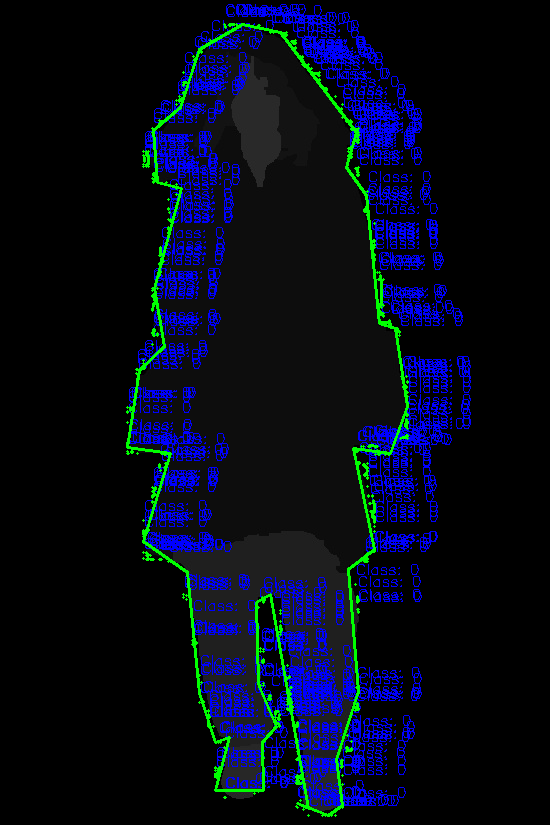

Visualizing seg_0133.jpeg


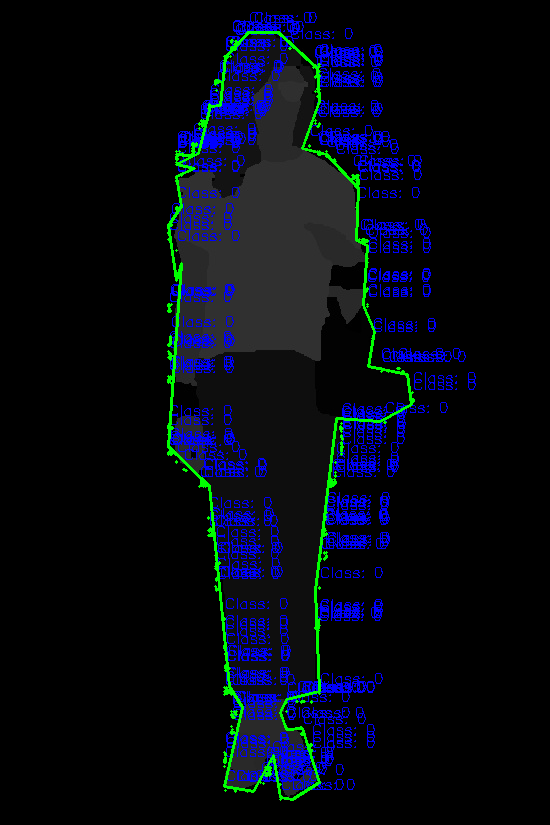

Visualizing seg_0371.jpeg


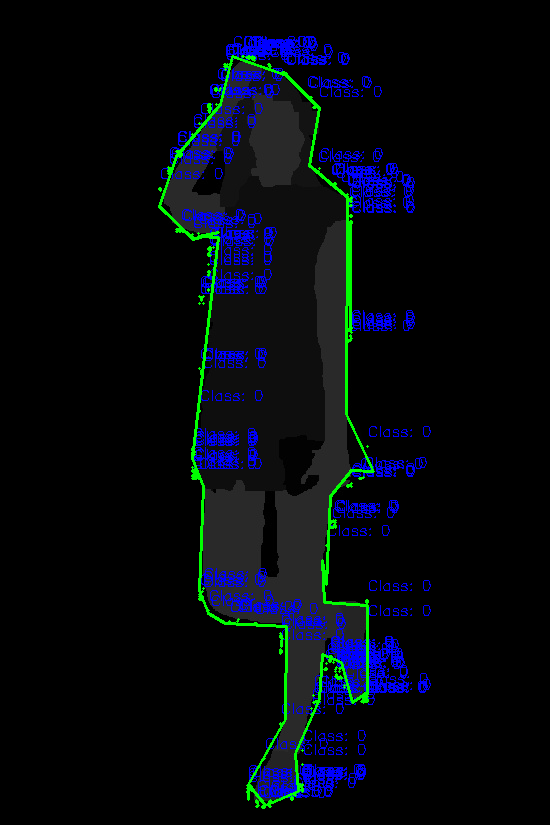

Visualizing seg_0768.jpeg


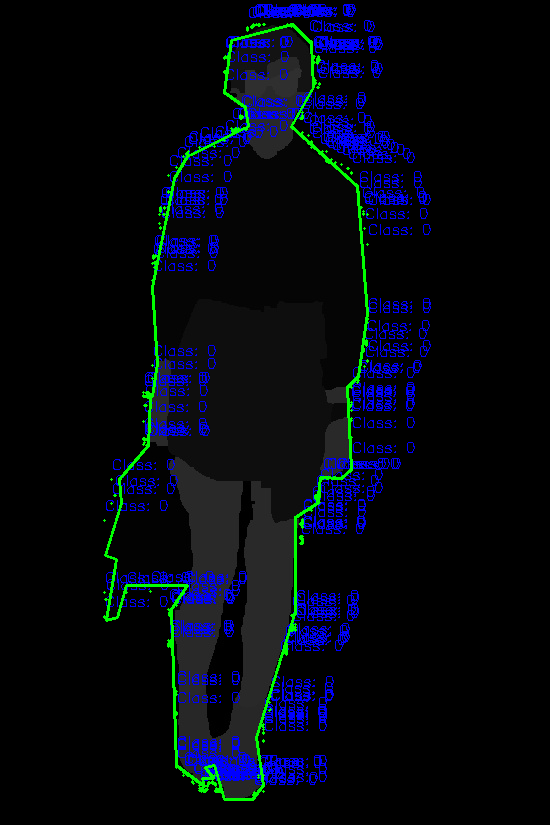

Visualizing seg_0163.jpeg


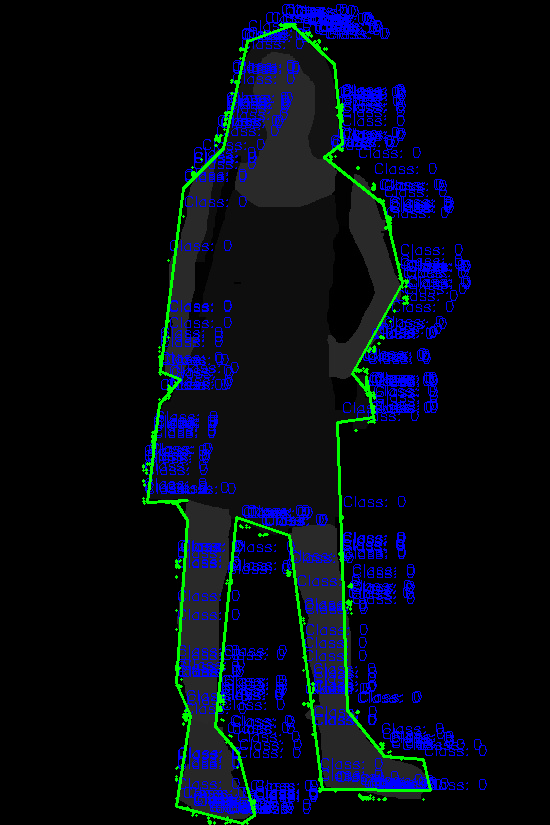

Visualizing seg_0579.jpeg


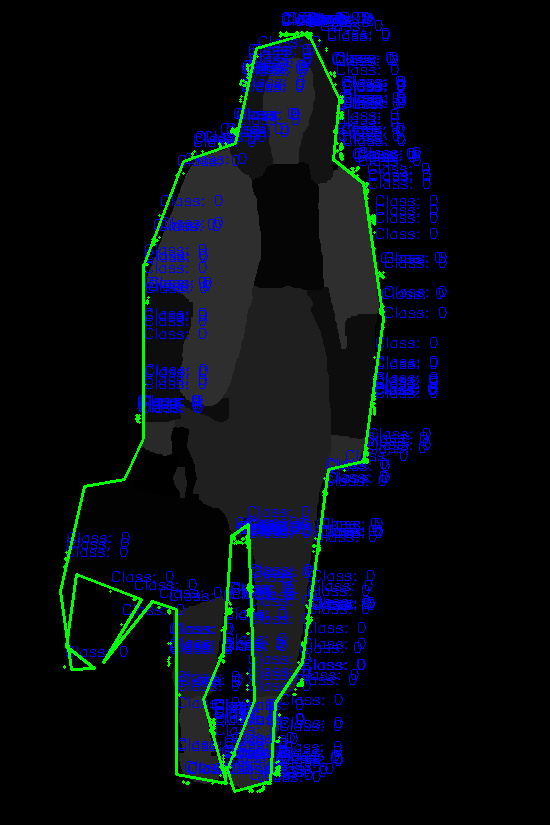

Visualizing seg_0780.jpeg


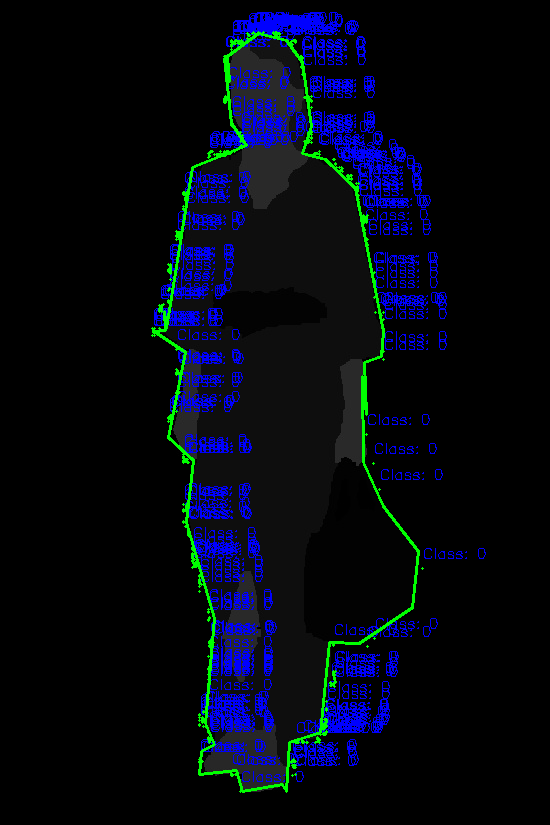

Visualizing seg_0938.jpeg


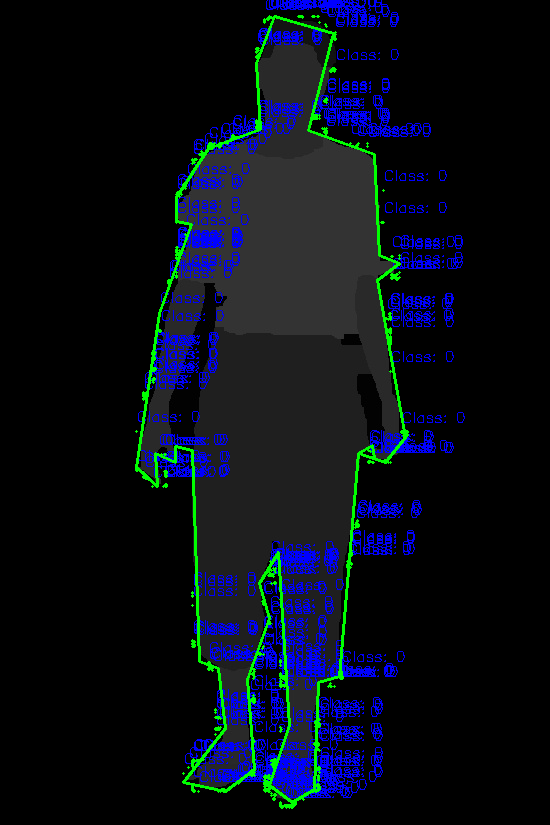

Visualizing seg_0618.jpeg


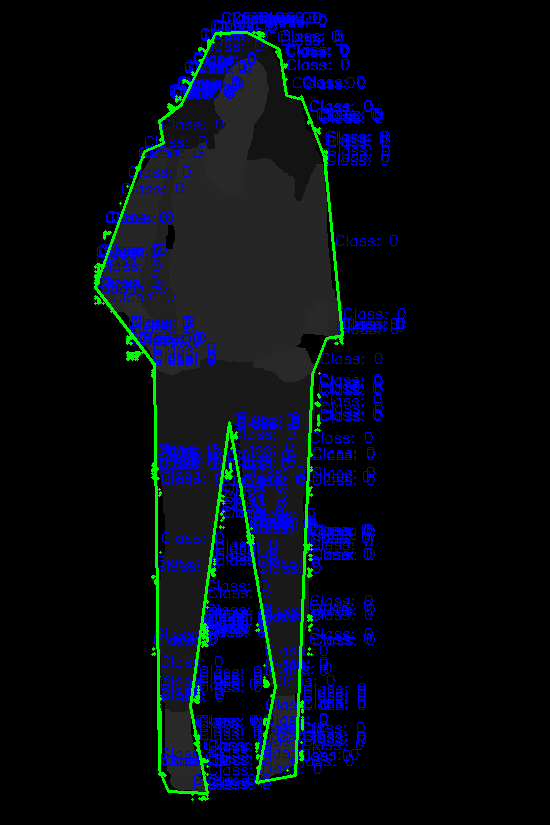

Visualizing seg_0543.jpeg


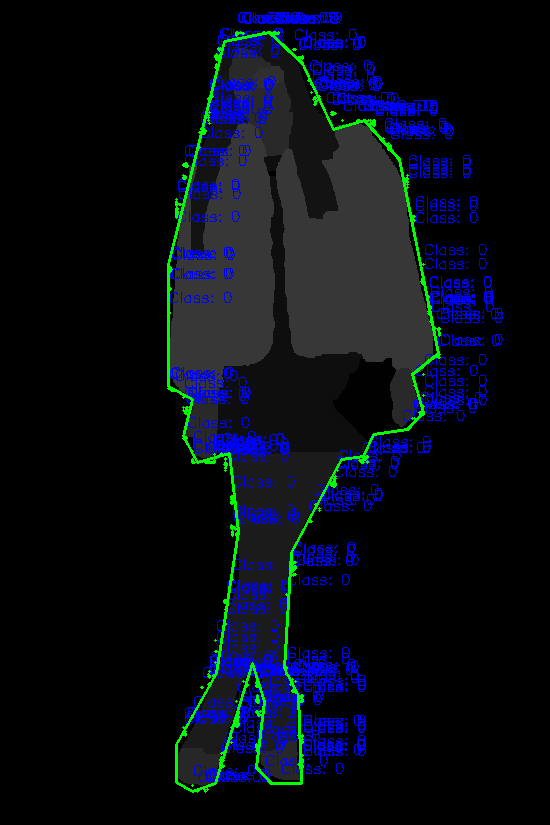

Visualizing seg_0365.jpeg


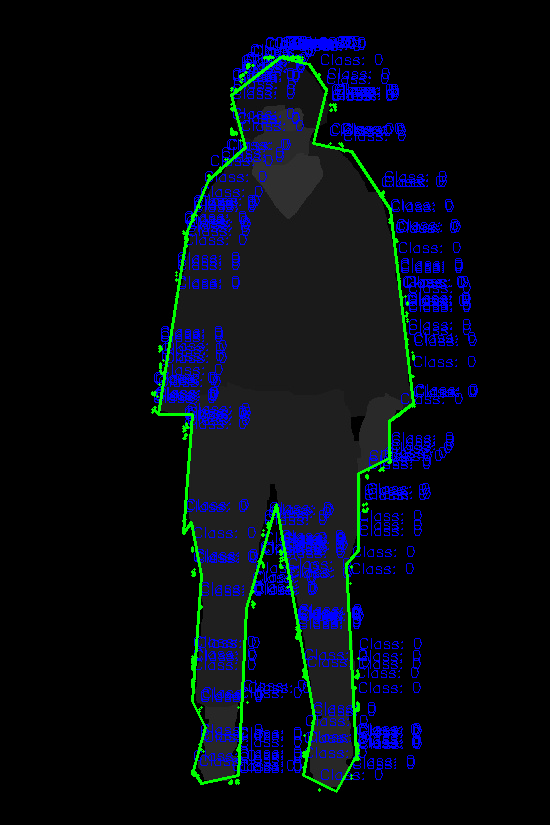

Visualizing seg_0521.jpeg


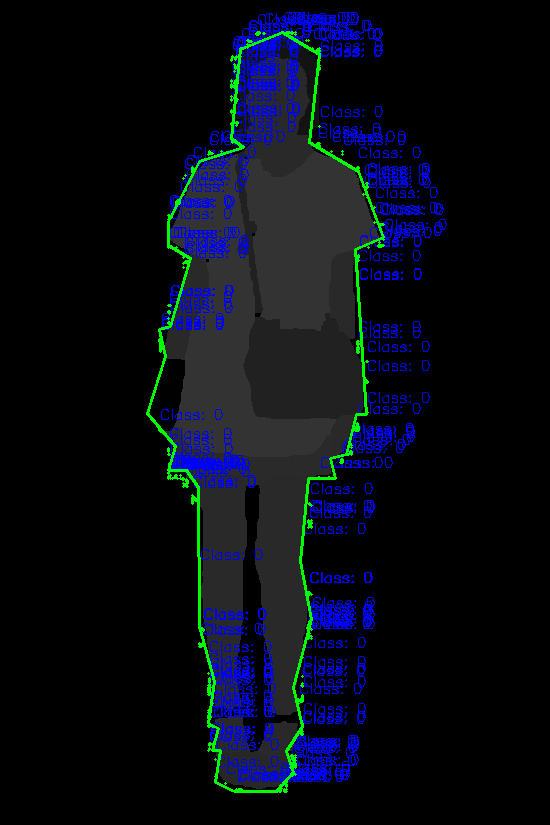

Visualizing seg_0077.jpeg


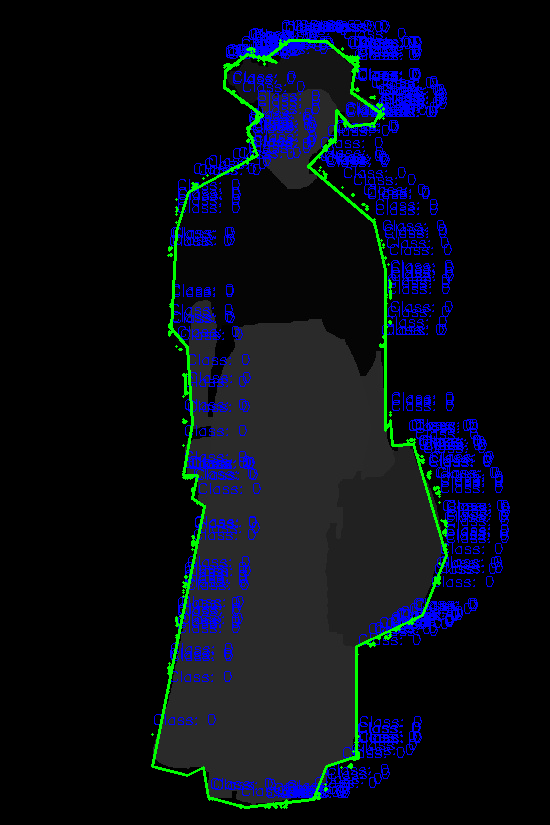

Visualizing seg_0396.jpeg


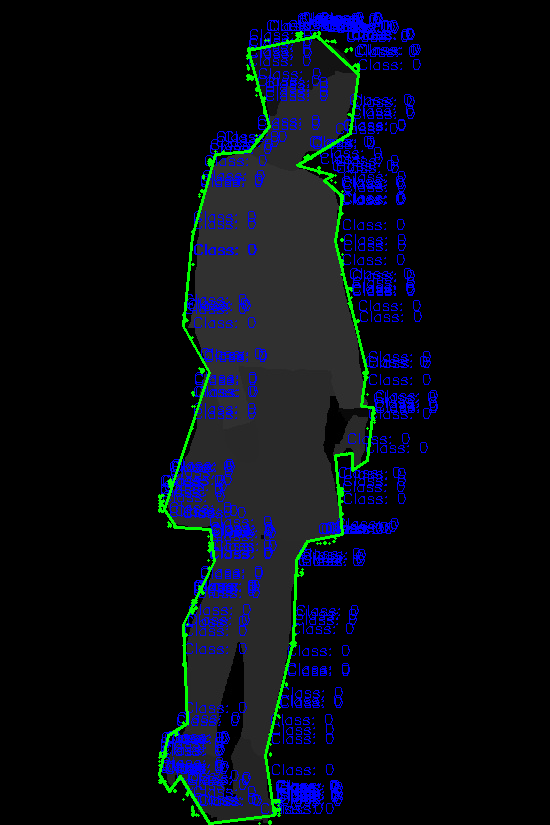

Visualizing seg_0740.jpeg


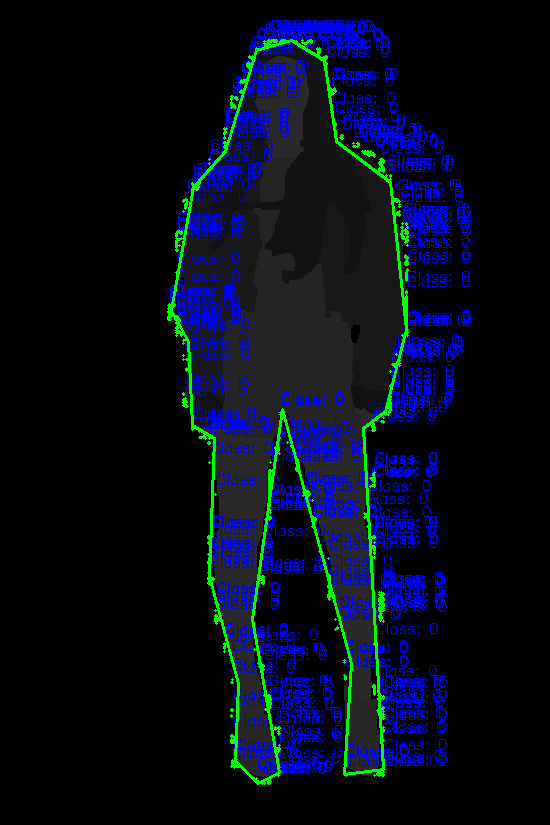

Visualizing seg_0097.jpeg


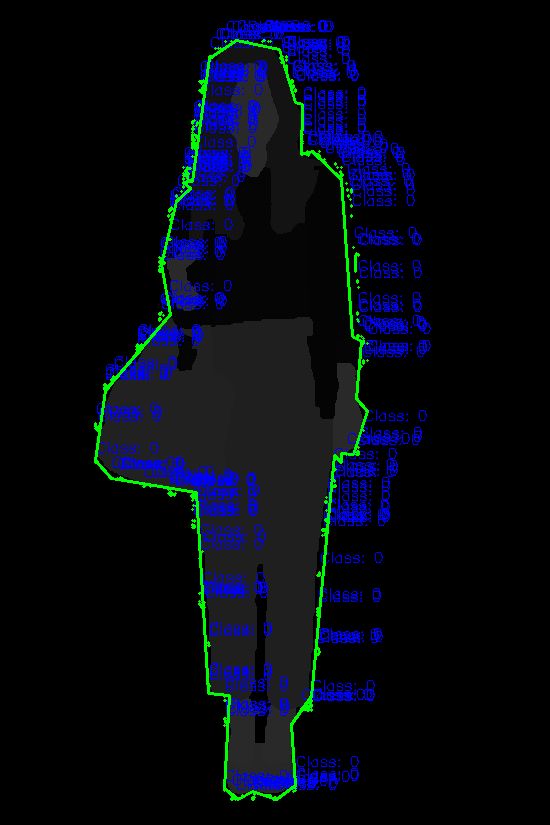

Visualizing seg_0813.jpeg


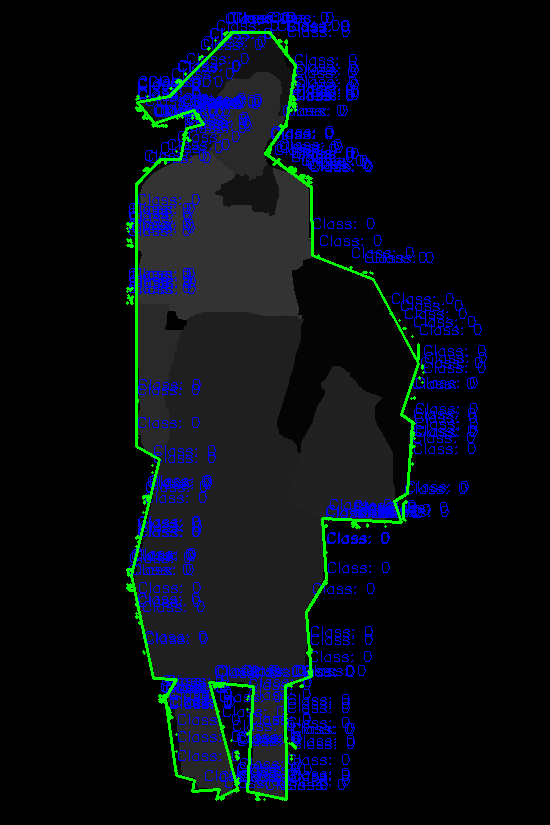

Visualizing seg_0902.jpeg


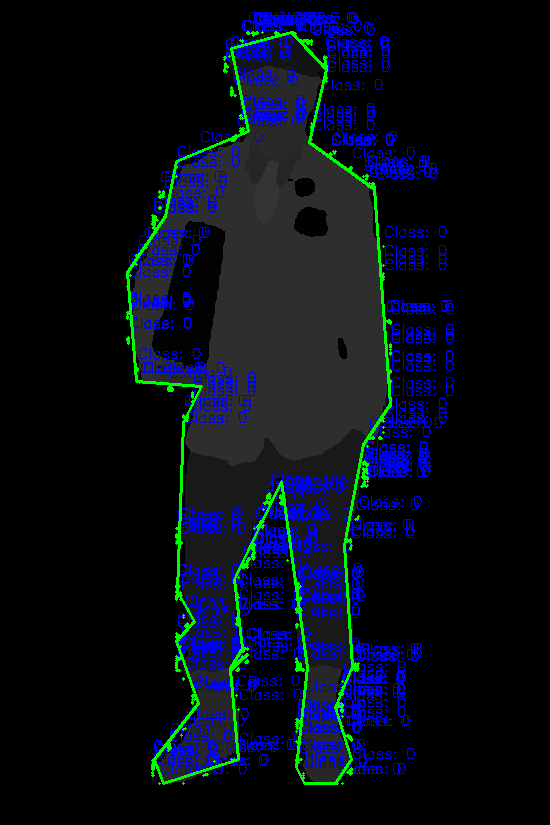

Visualizing seg_0867.jpeg


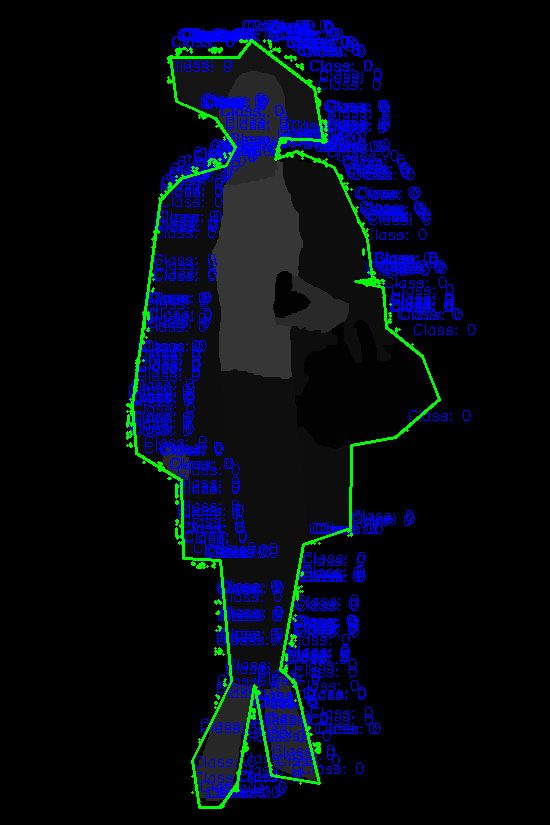

Visualizing seg_0674.jpeg


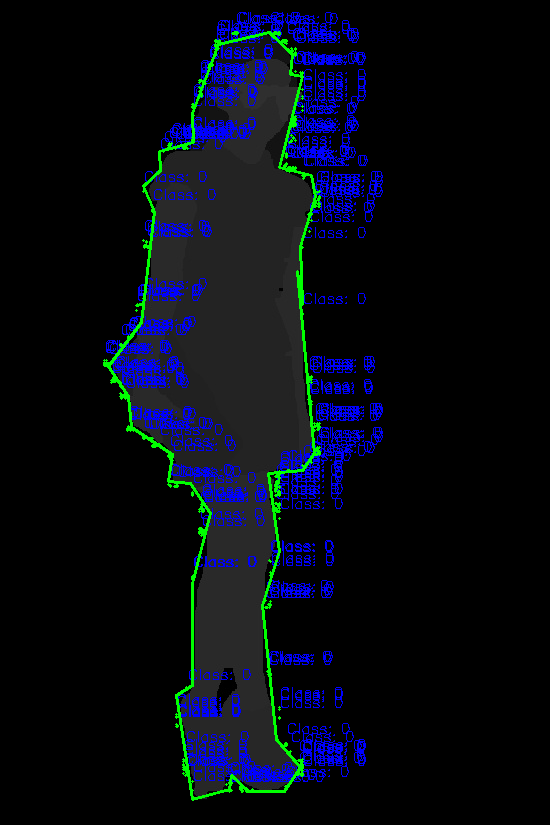

Visualizing seg_0169.jpeg


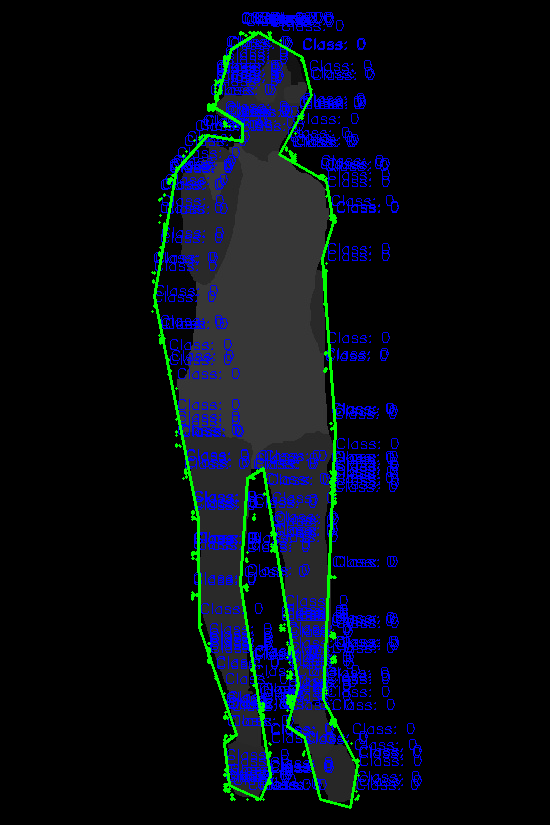

Visualizing seg_0149.jpeg


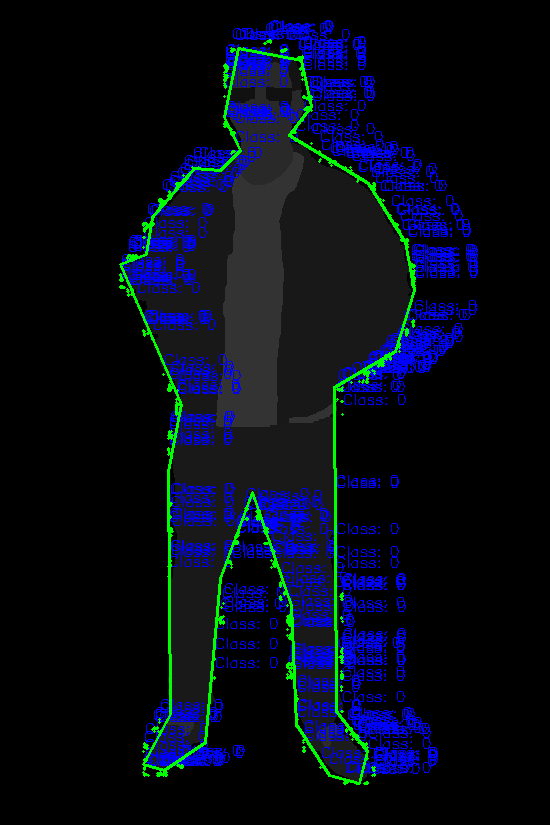

Visualizing seg_0736.jpeg


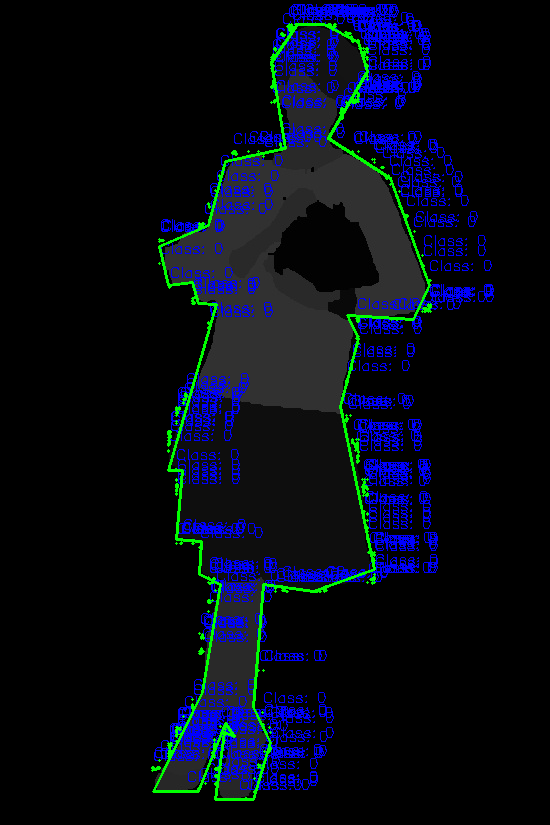

Visualizing seg_0011.jpeg


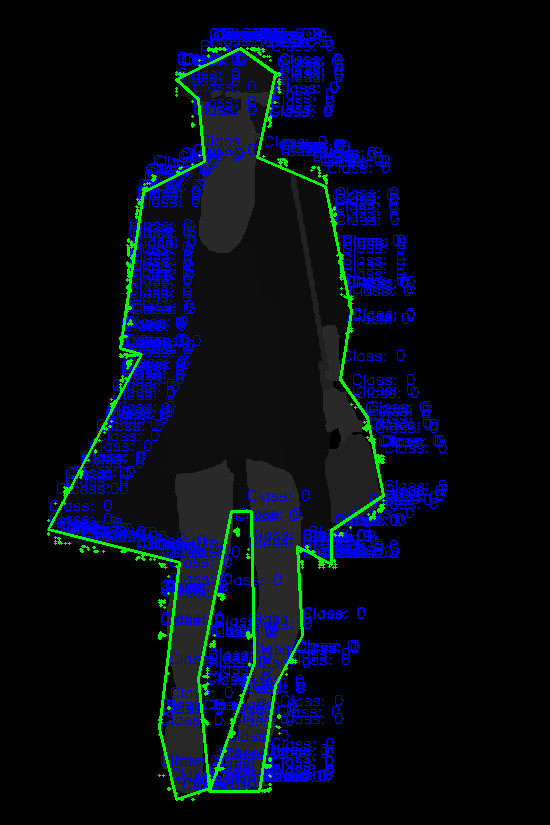

Visualizing seg_0266.jpeg


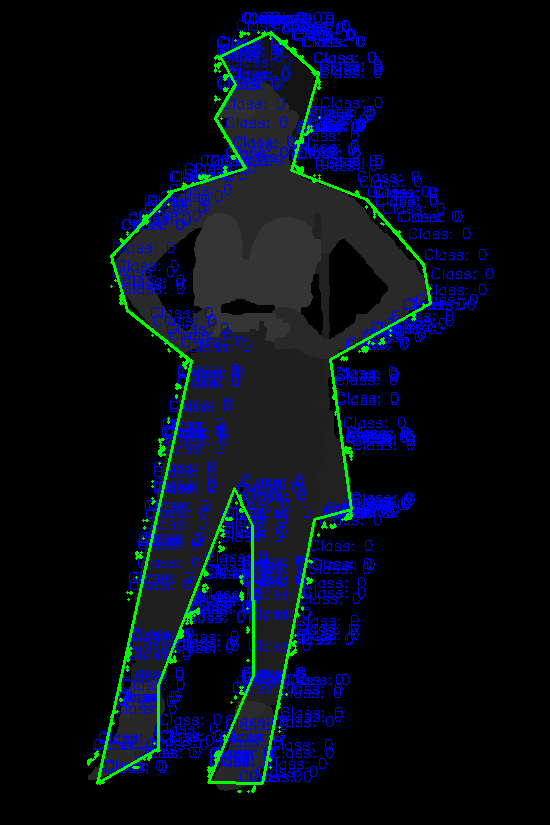

Visualizing seg_0513.jpeg


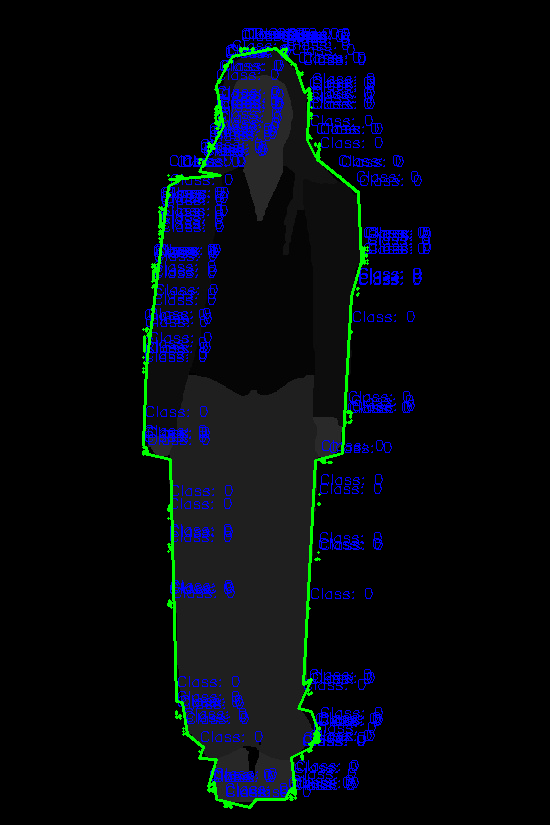

Visualizing seg_0790.jpeg


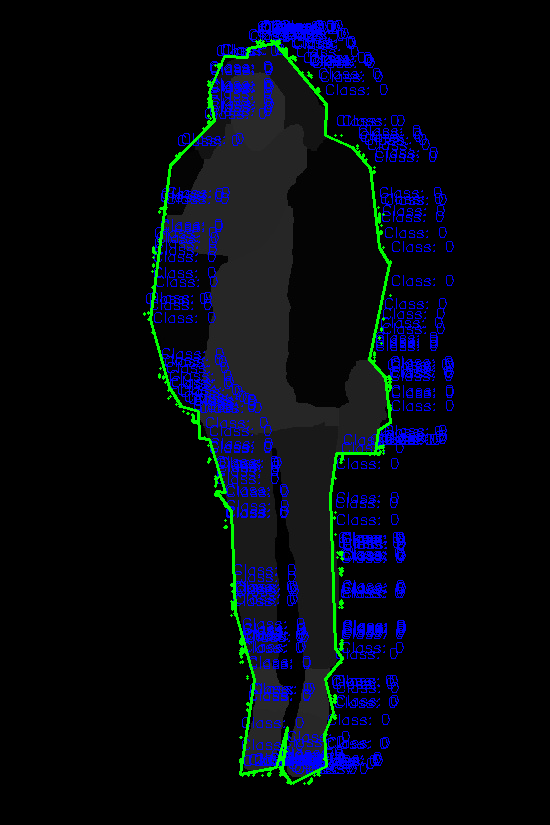

Visualizing seg_0551.jpeg


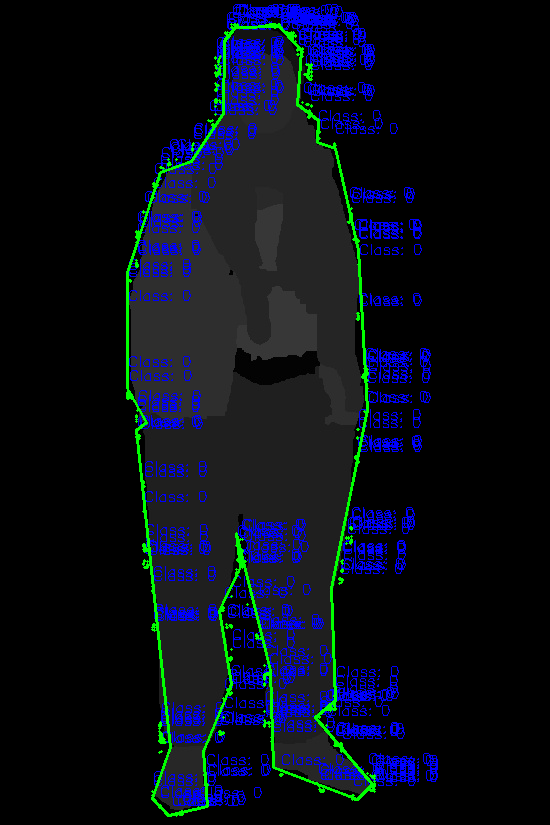

Visualizing seg_0049.jpeg


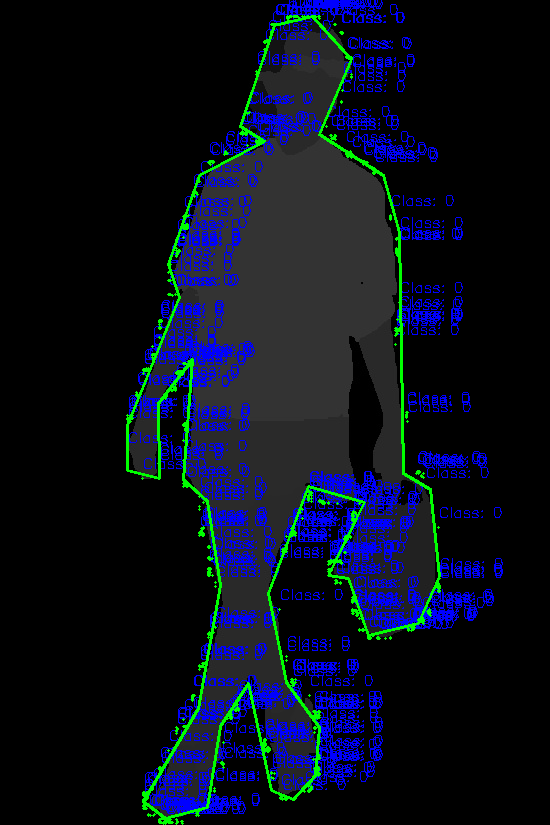

Visualizing seg_0383.jpeg


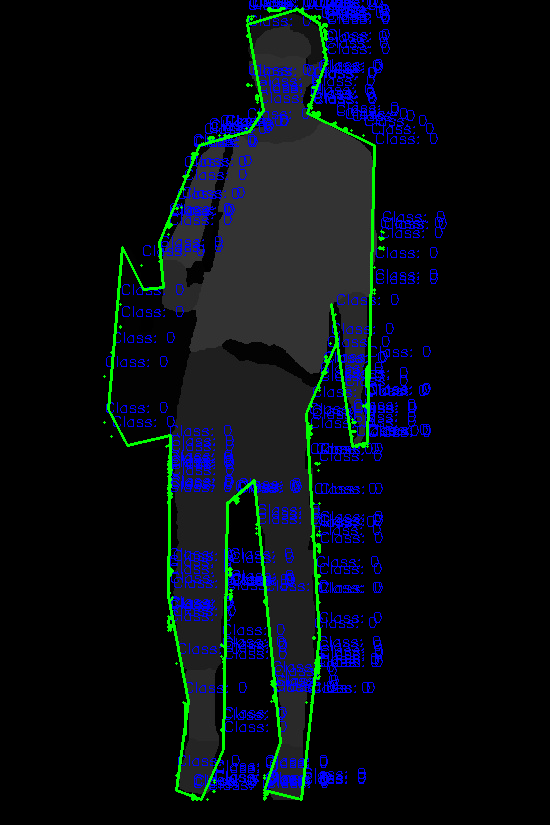

Visualizing seg_0617.jpeg


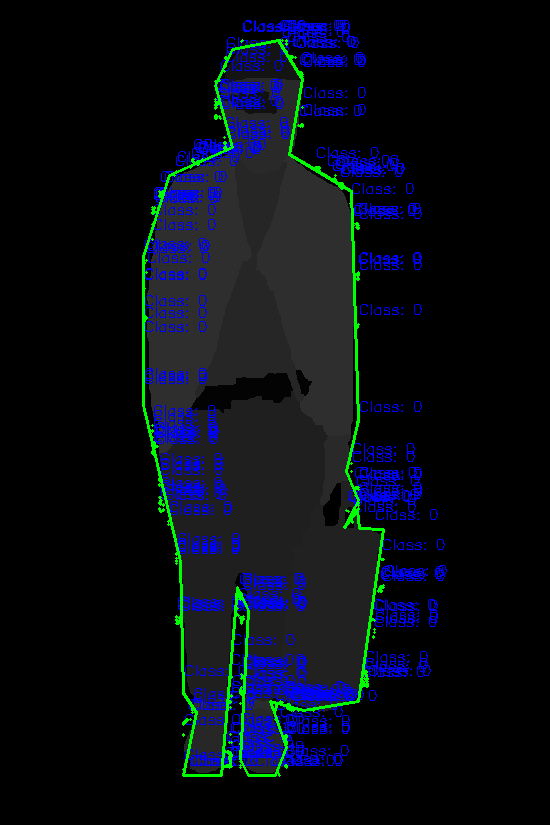

Visualizing seg_0447.jpeg


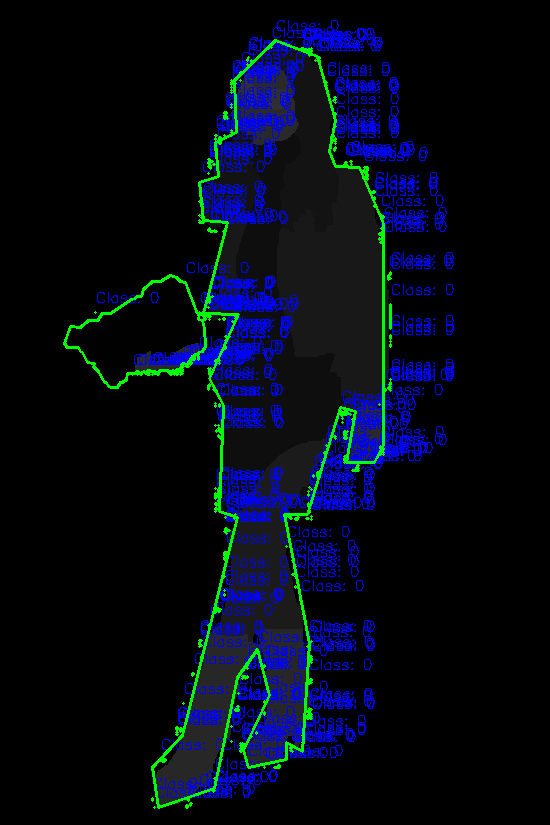

Visualizing seg_0277.jpeg


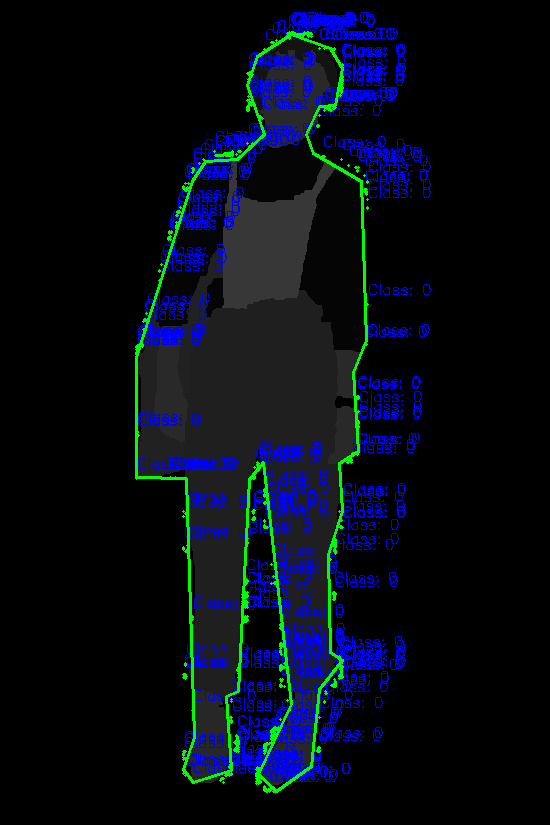

Visualizing seg_0381.jpeg


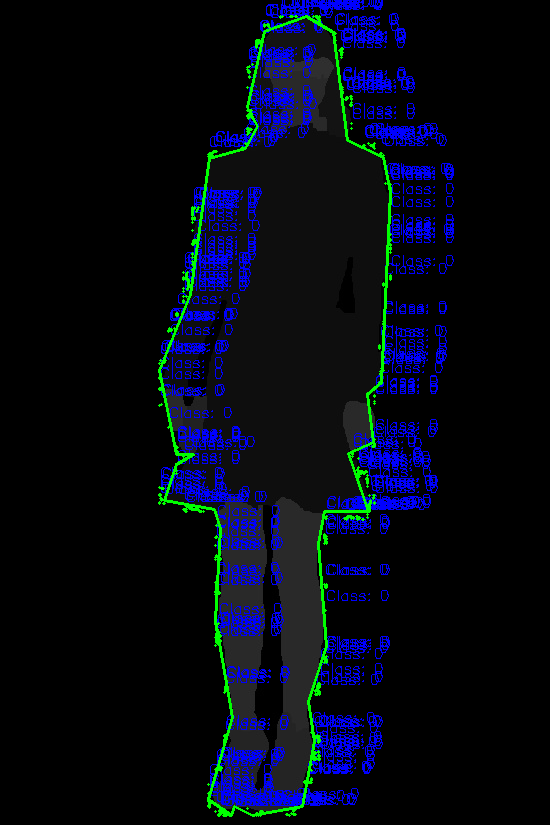

Visualizing seg_0730.jpeg


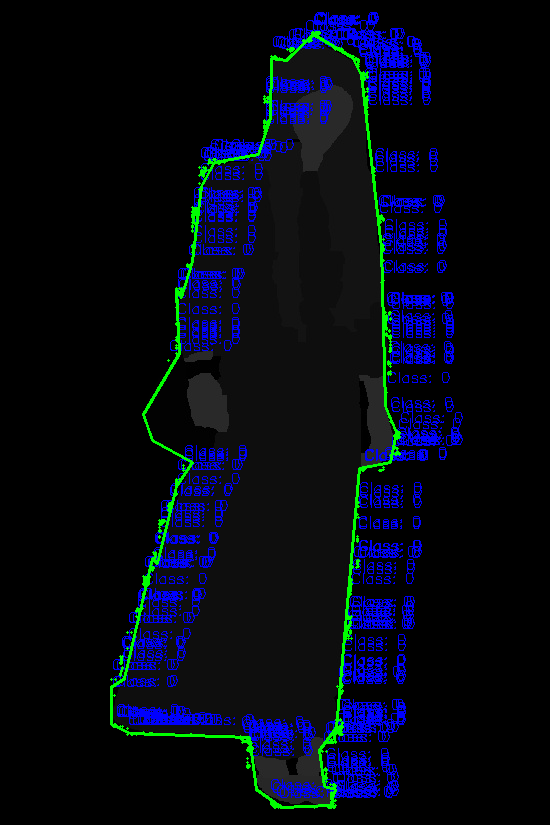

Visualizing seg_0959.jpeg


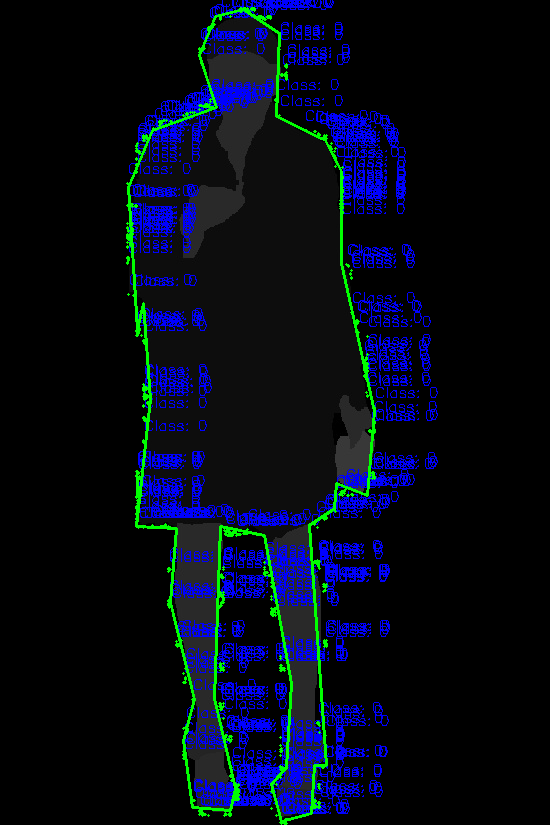

Visualizing seg_0646.jpeg


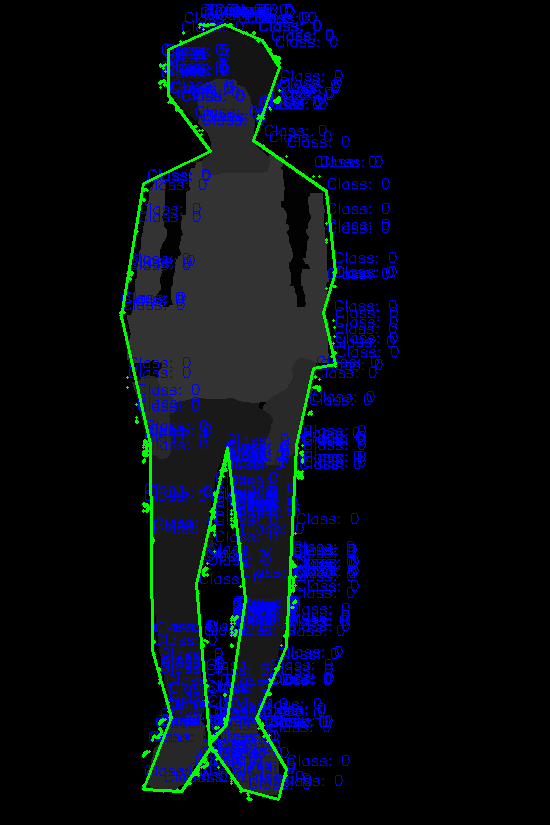

Visualizing seg_0113.jpeg


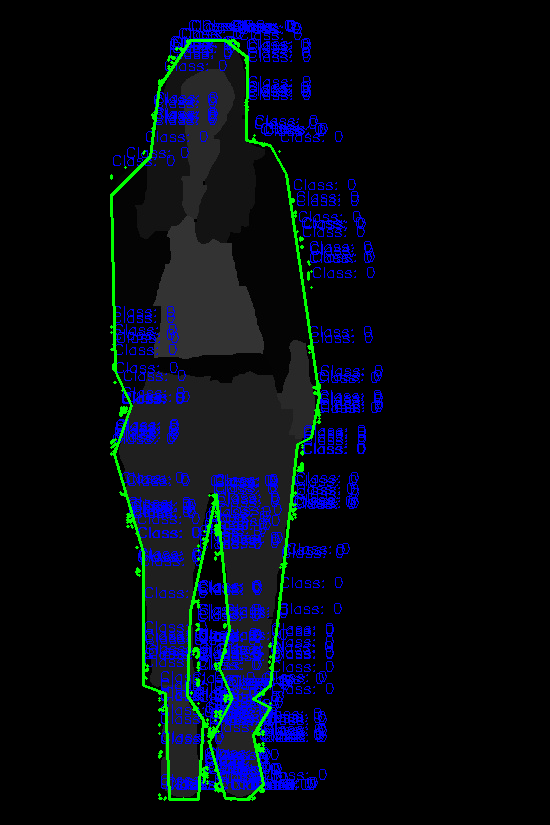

Visualizing seg_0723.jpeg


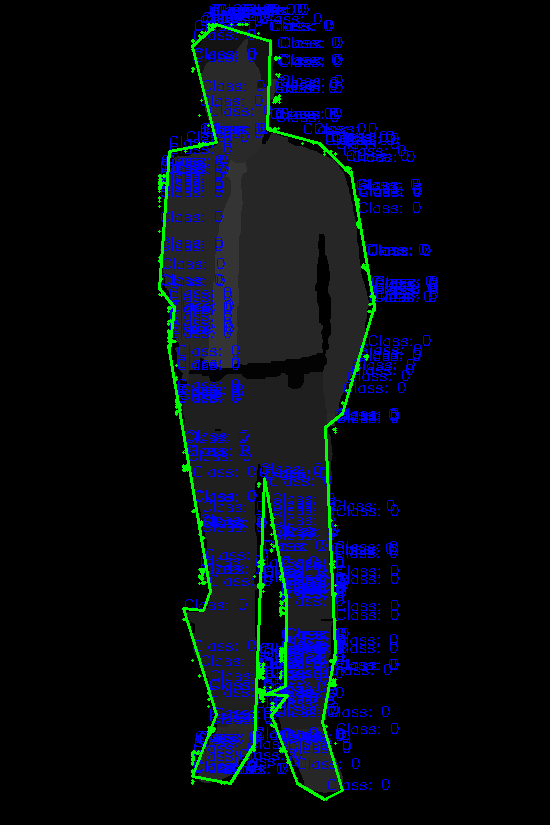

Visualizing seg_0770.jpeg


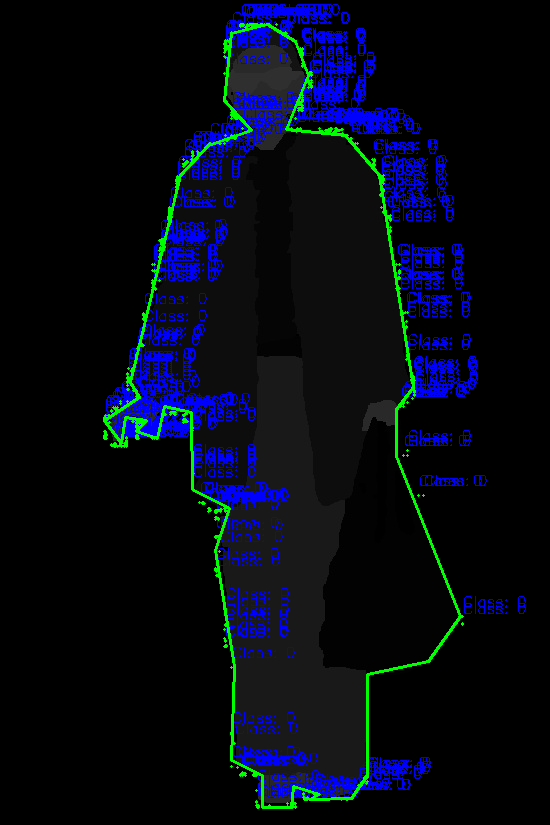

Visualizing seg_0575.jpeg


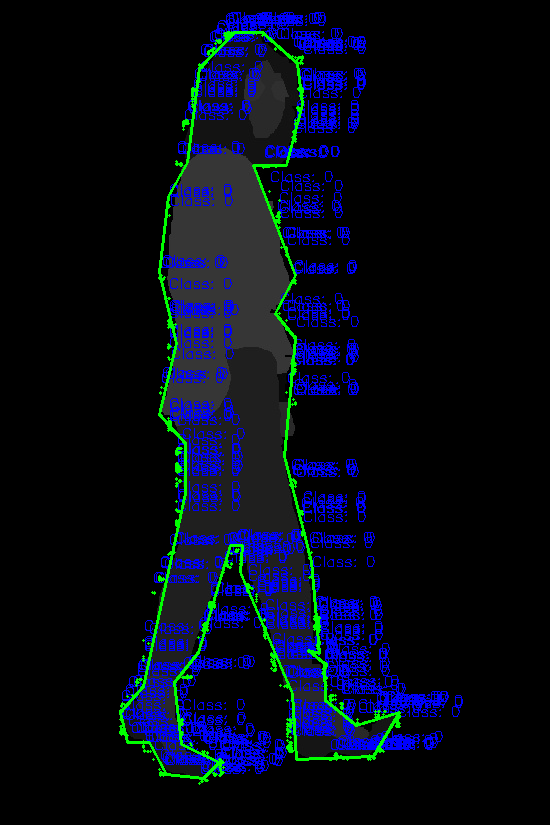

Visualizing seg_0260.jpeg


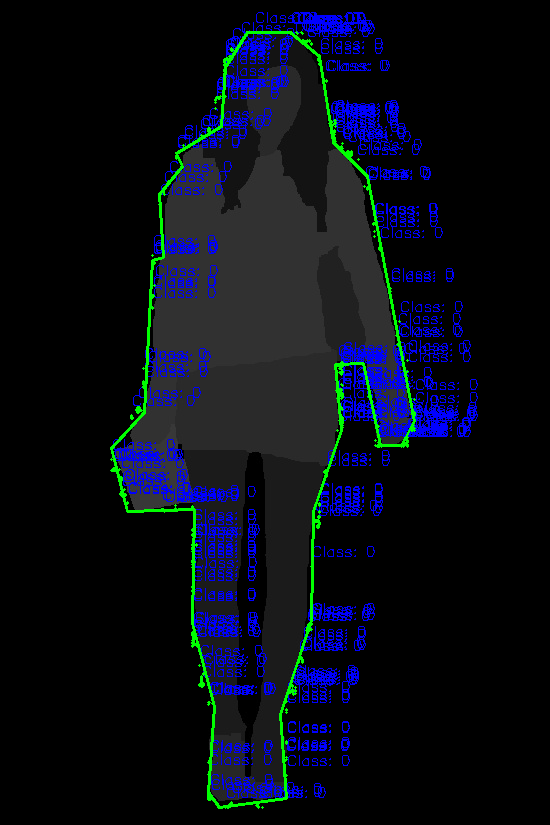

Visualizing seg_0915.jpeg


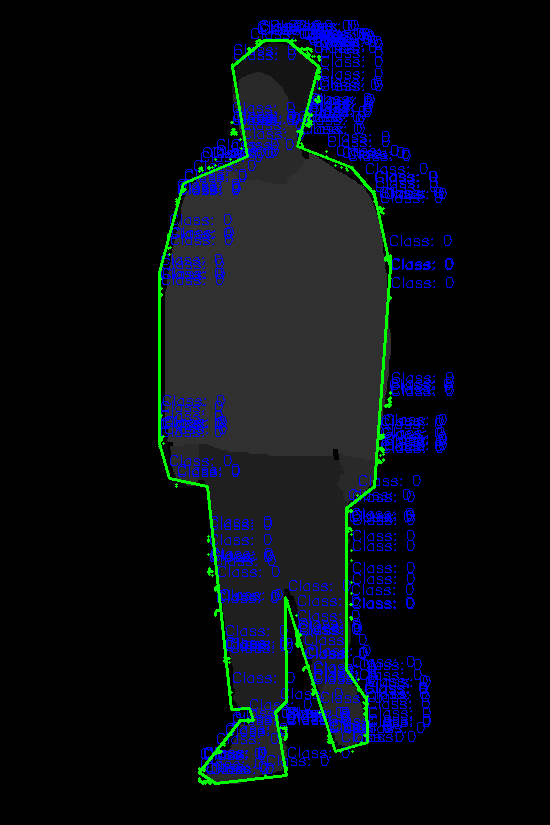

Visualizing seg_0991.jpeg


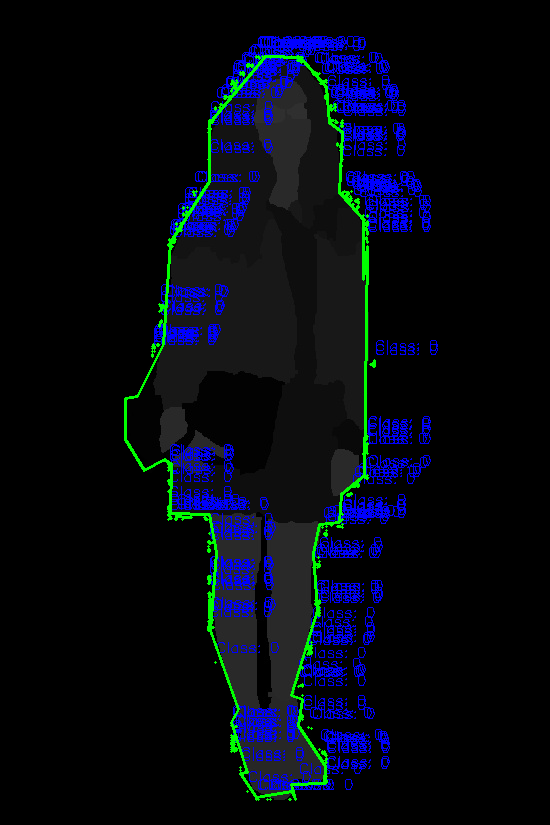

Visualizing seg_0448.jpeg


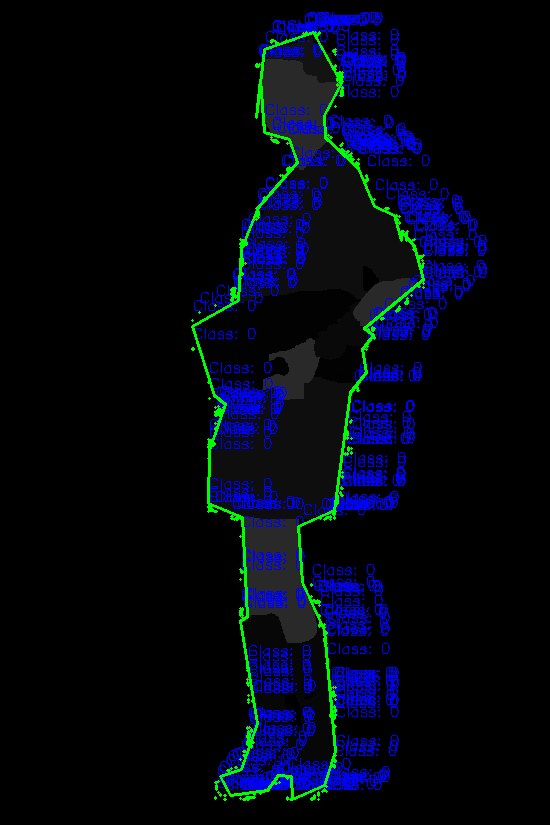

Visualizing seg_0848.jpeg


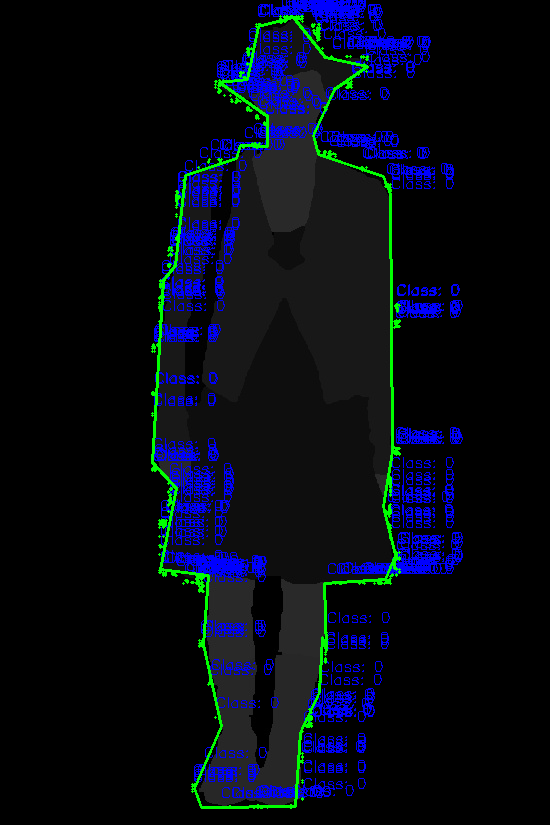

Visualizing seg_0743.jpeg


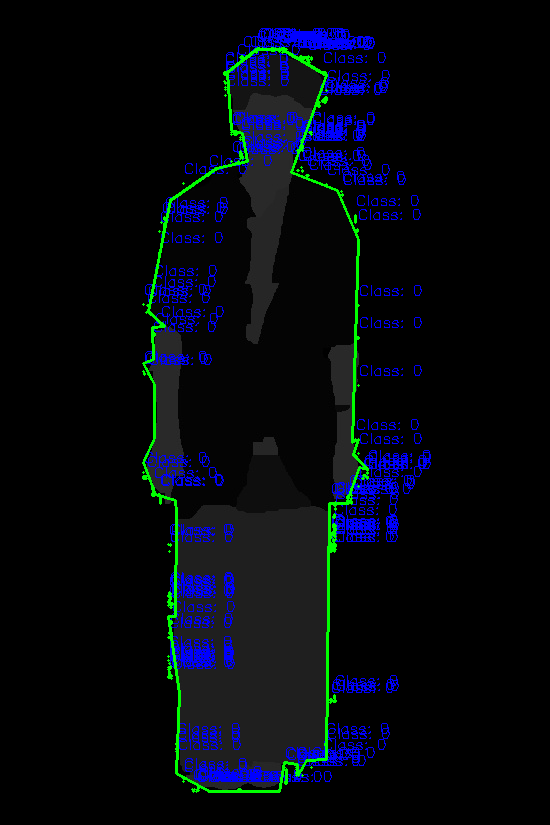

Visualizing seg_0581.jpeg


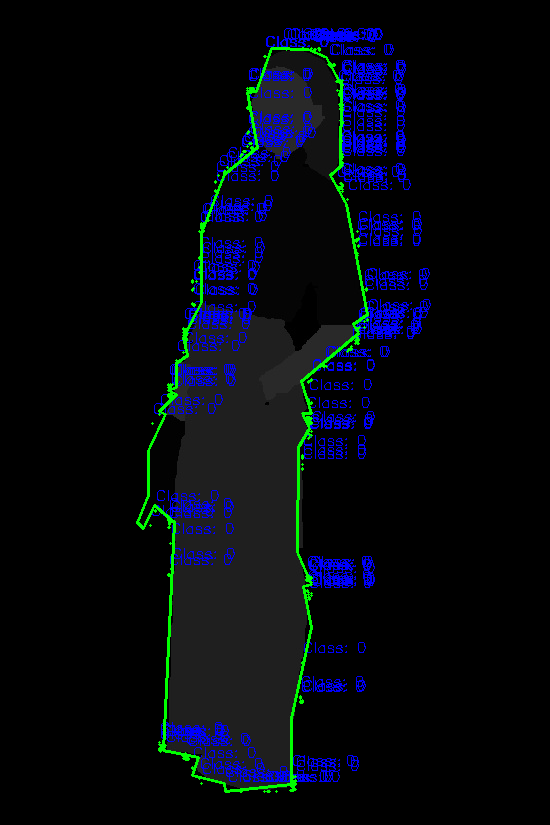

Visualizing seg_0022.jpeg


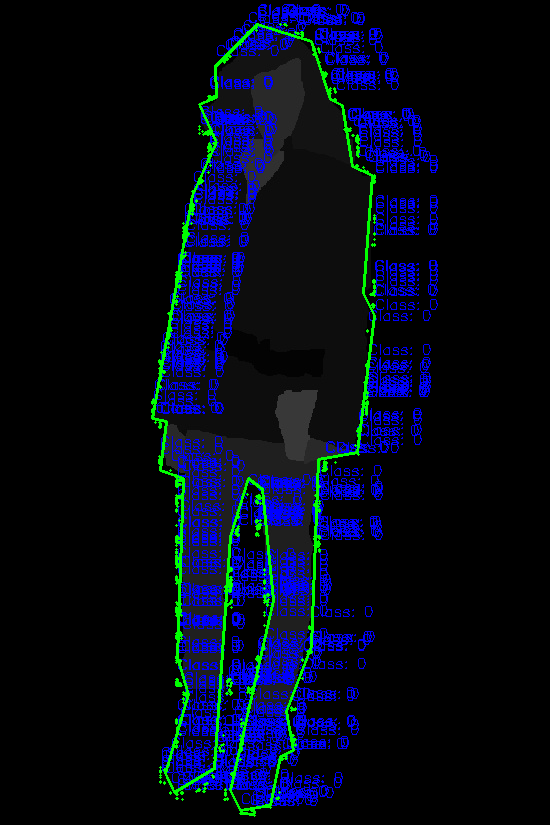

Visualizing seg_0145.jpeg


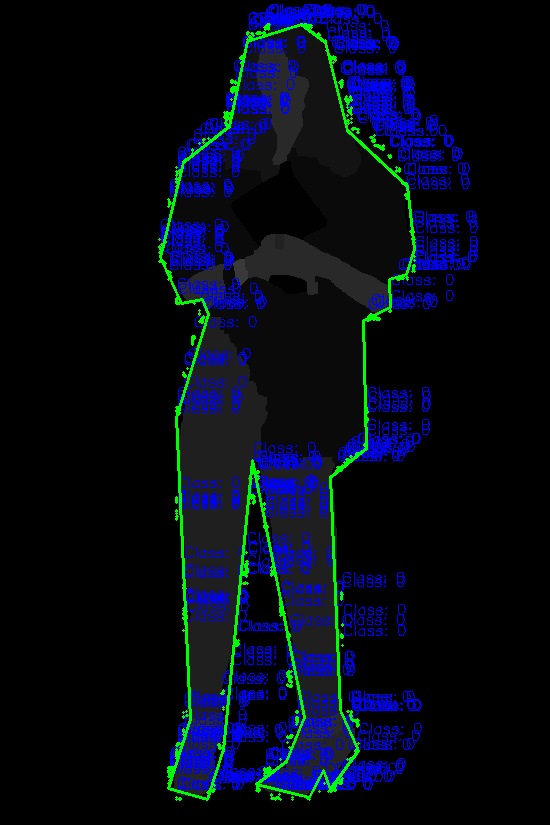

Visualizing seg_0198.jpeg


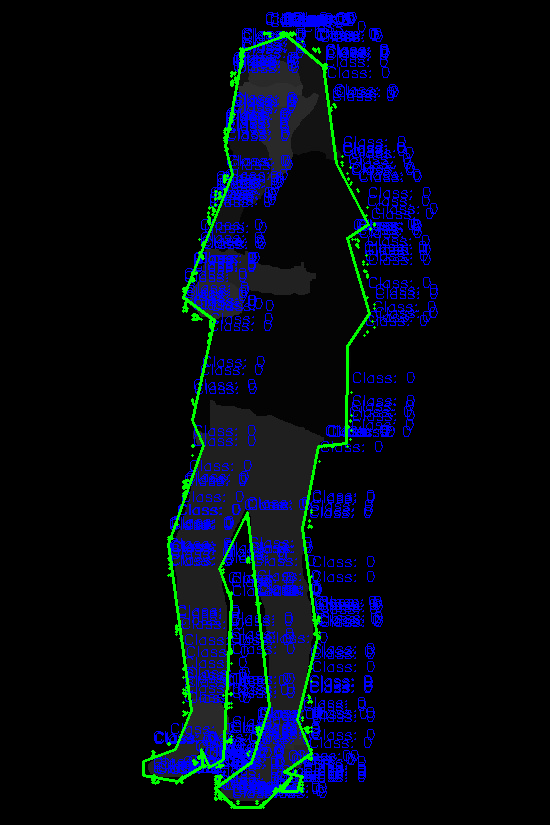

Visualizing seg_0035.jpeg


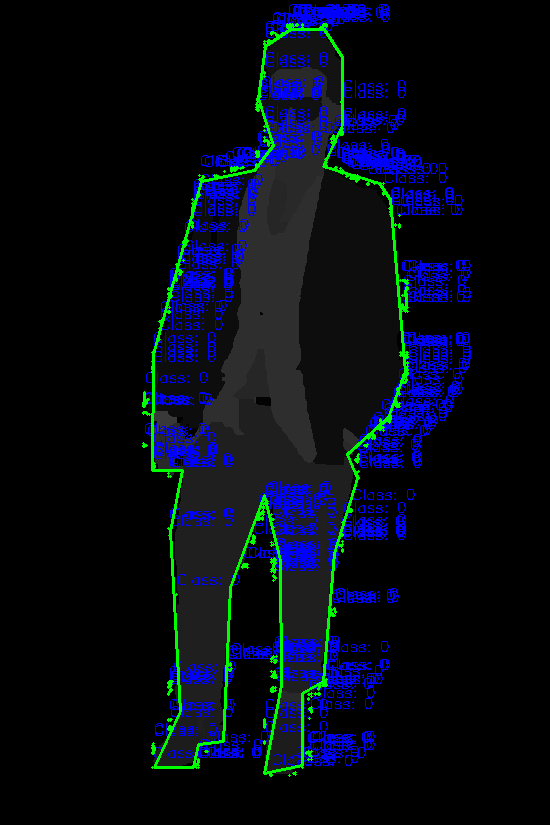

Visualizing seg_0910.jpeg


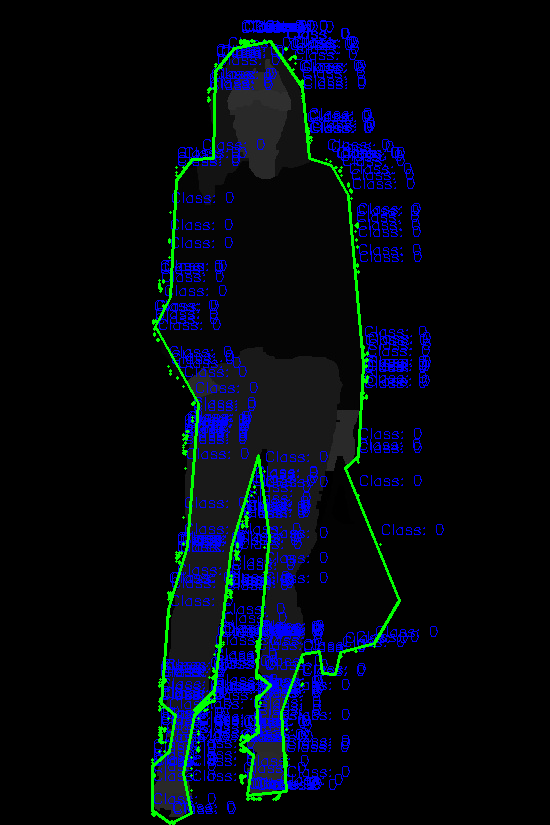

Visualizing seg_0075.jpeg


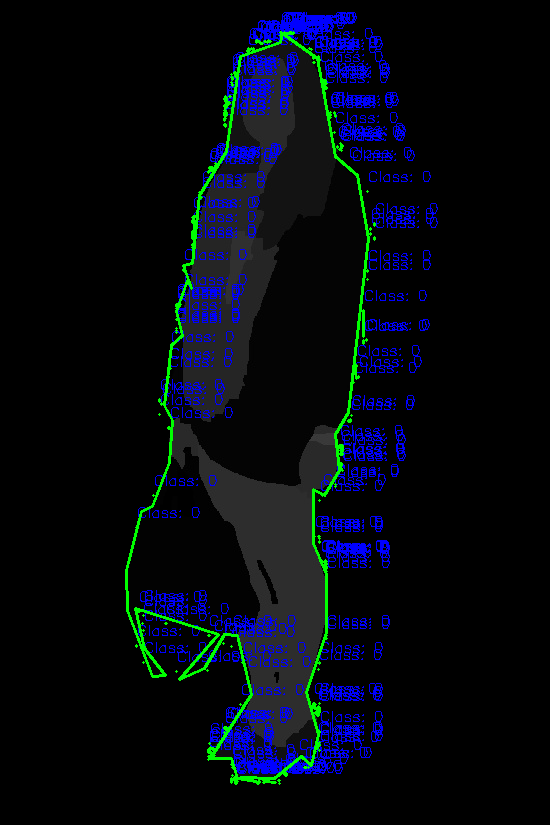

Visualizing seg_0804.jpeg


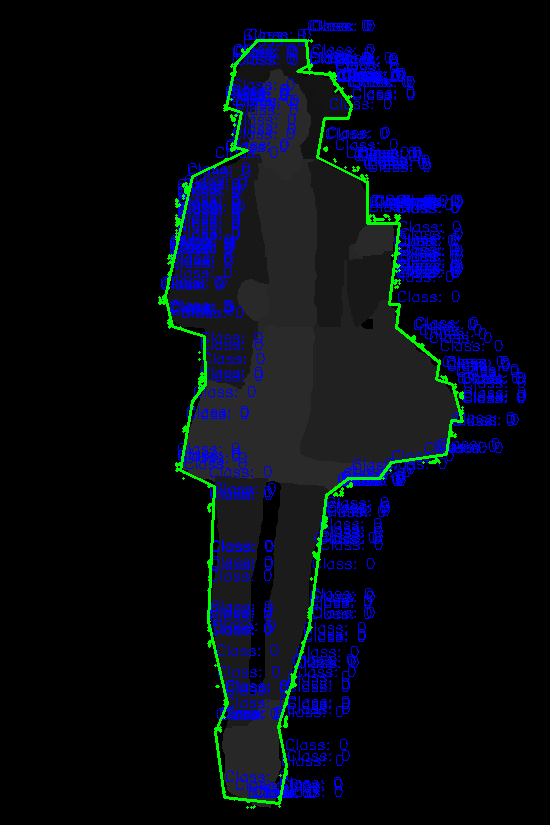

Visualizing seg_0165.jpeg


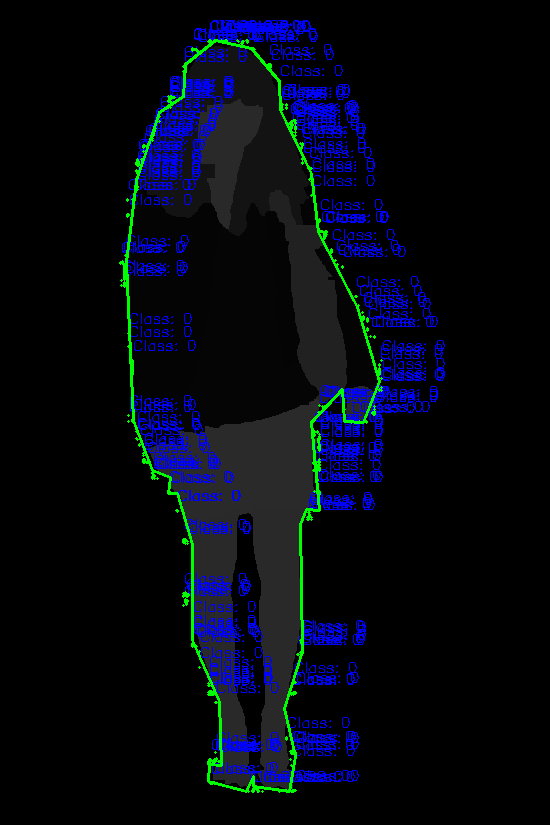

Visualizing seg_0193.jpeg


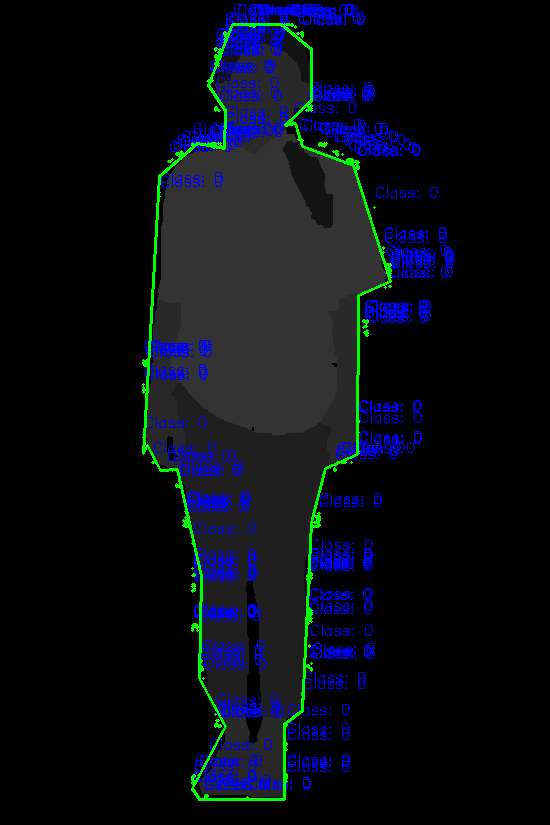

Visualizing seg_0643.jpeg


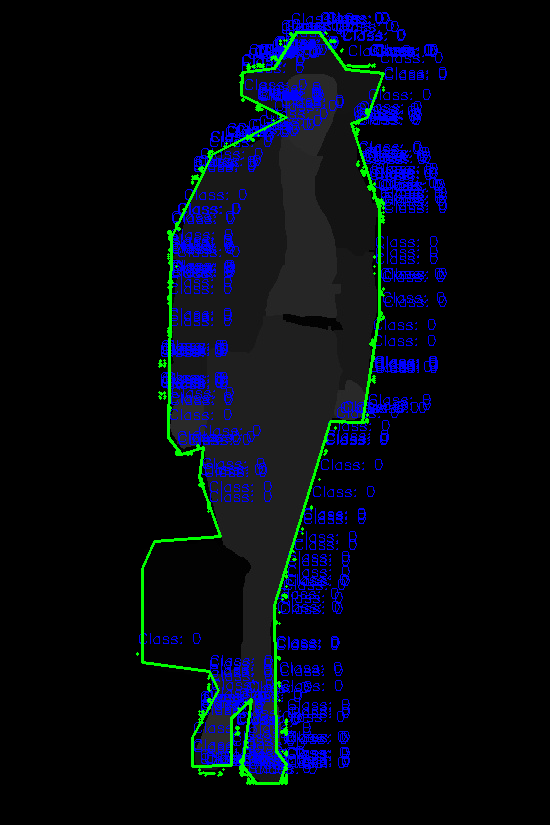

Visualizing seg_0612.jpeg


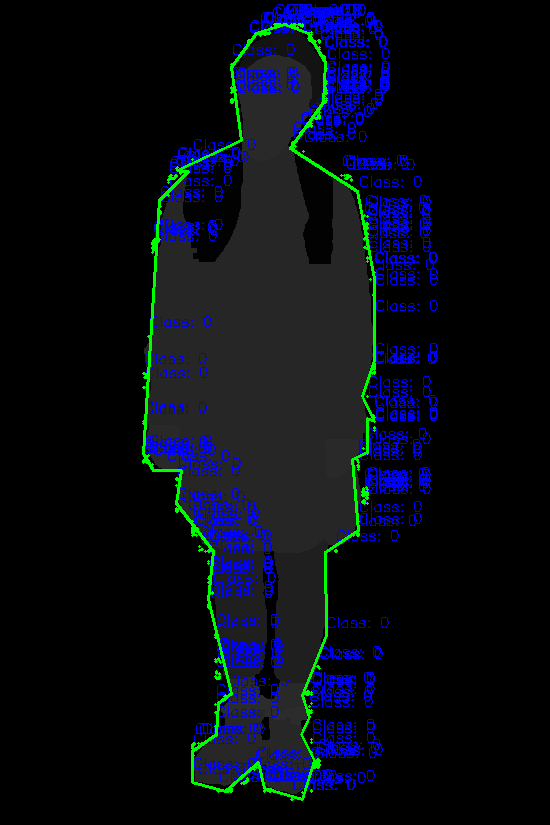

Visualizing seg_0017.jpeg


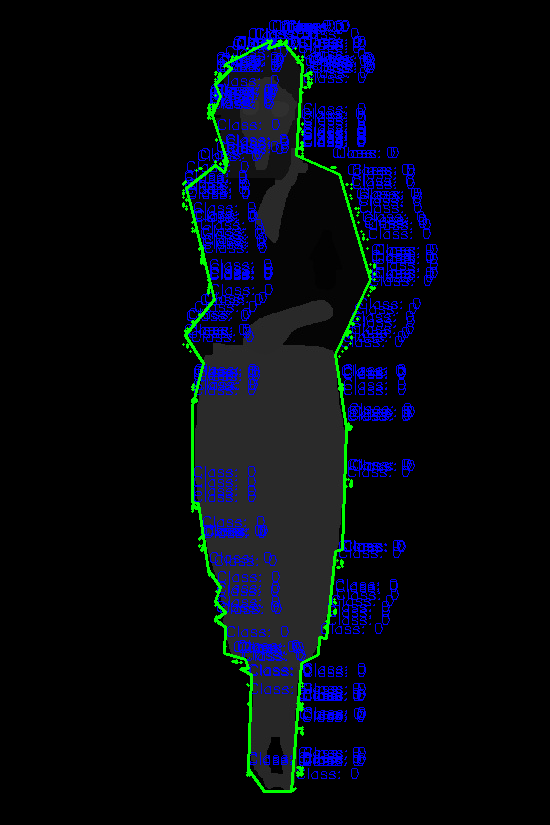

Visualizing seg_0126.jpeg


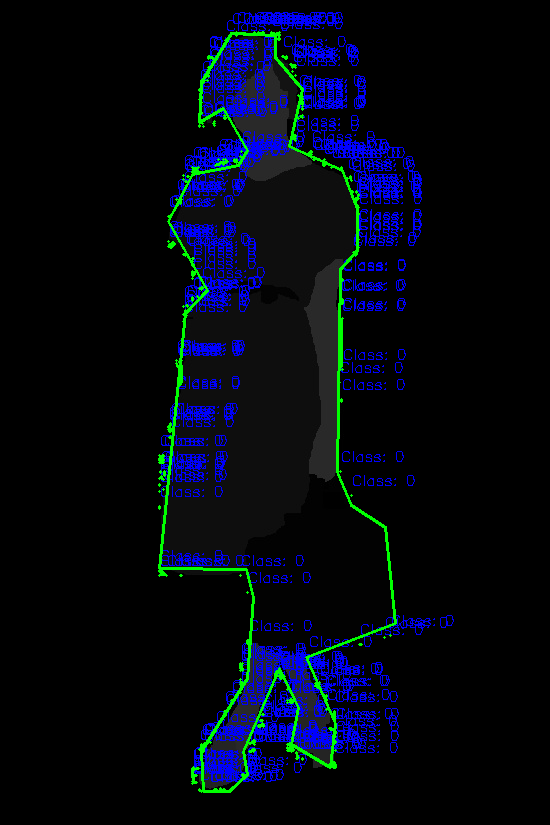

Visualizing seg_0694.jpeg


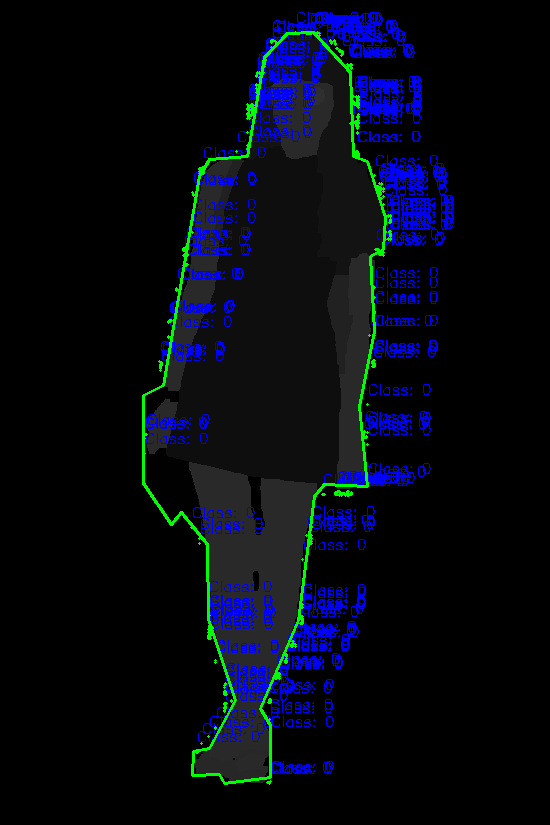

Visualizing seg_0401.jpeg


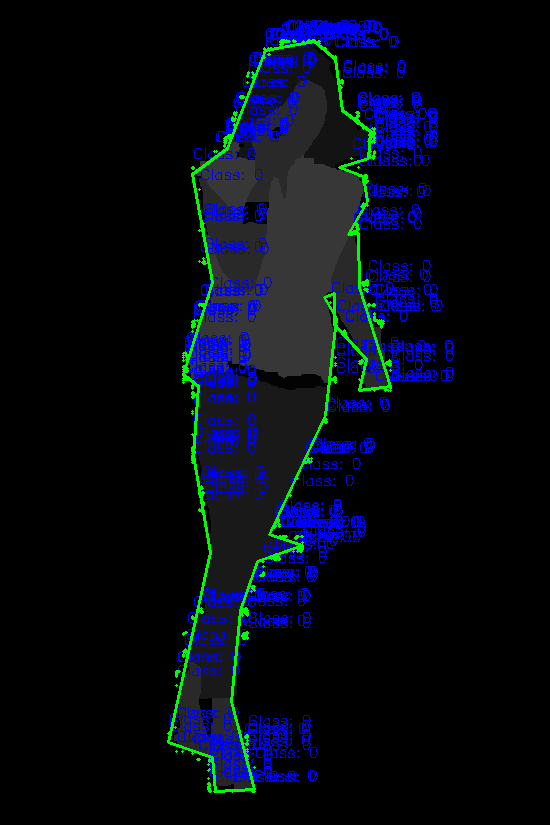

Visualizing seg_0326.jpeg


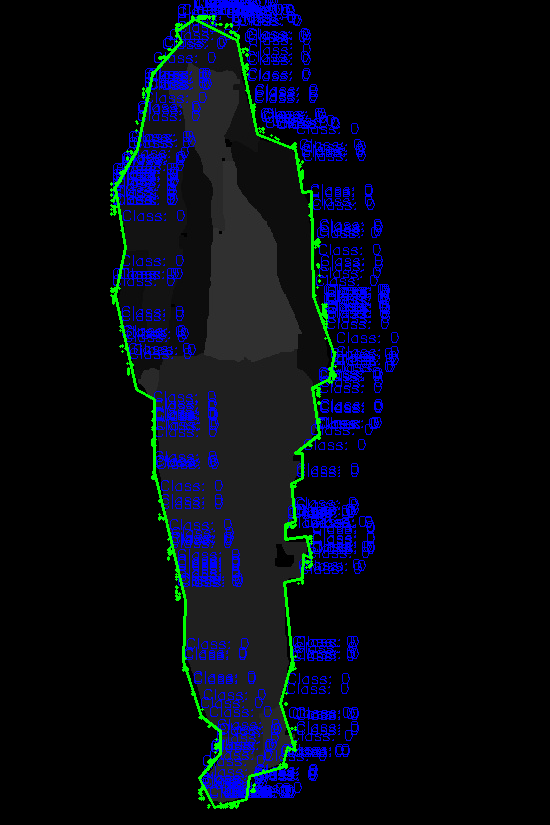

Visualizing seg_0128.jpeg


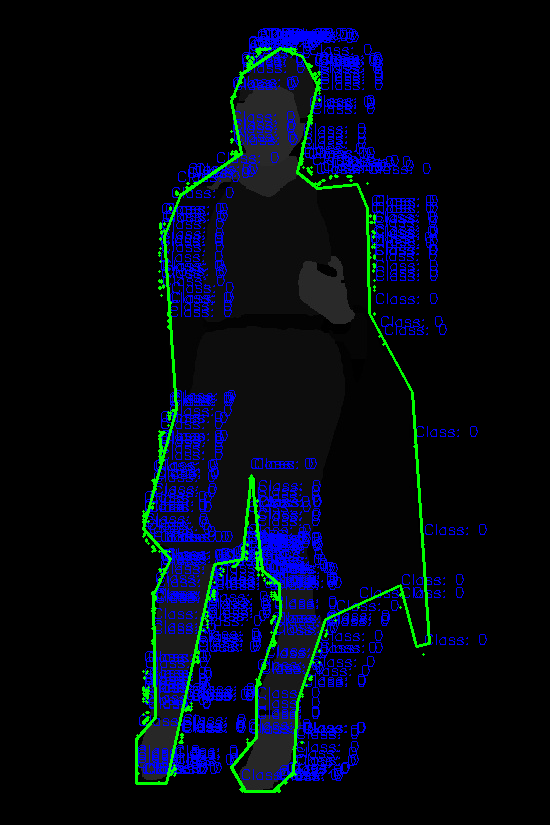

Visualizing seg_0606.jpeg


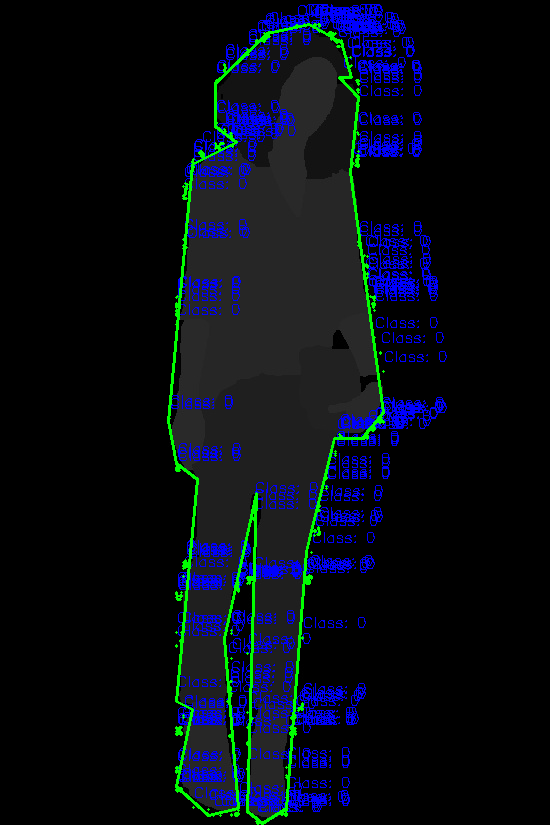

Visualizing seg_0621.jpeg


KeyboardInterrupt: 

In [10]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image_dir = "/content/dataset/jpeg_masks/MASKS"
label_dir = "/content/dataset_yolo/labels"

def visualize_mask(image_path, label_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error loading image: {image_path}")
        return

    height, width, _ = image.shape

    try:
        with open(label_path, "r") as file:
            lines = file.readlines()
            for line in lines:
                data = line.strip().split()
                class_id = int(data[0])
                points = np.array(data[1:], dtype=np.float32).reshape(-1, 2)

                points[:, 0] *= width
                points[:, 1] *= height
                points = points.astype(np.int32)

                cv2.polylines(image, [points], isClosed=True, color=(0, 255, 0), thickness=2)
                cv2.putText(image, f"Class: {class_id}", (points[0][0], points[0][1] - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
    except Exception as e:
        print(f"Error reading label: {label_path} - {e}")

    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

for image_name in os.listdir(image_dir):
    if image_name.endswith(".jpg") or image_name.endswith(".jpeg"):
        label_name = image_name.replace(".jpg", ".txt").replace(".jpeg", ".txt")
        image_path = os.path.join(image_dir, image_name)
        label_path = os.path.join(label_dir, label_name)

        if os.path.exists(label_path):
            print(f"Visualizing {image_name}")
            visualize_mask(image_path, label_path)
        else:
            print(f"Label not found for {image_name}")



image 1/1 /content/dataset_yolo/images/val/img_0003.jpeg: 640x448 (no detections), 104.0ms
Speed: 2.6ms preprocess, 104.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 448)


TypeError: Image data of dtype object cannot be converted to float

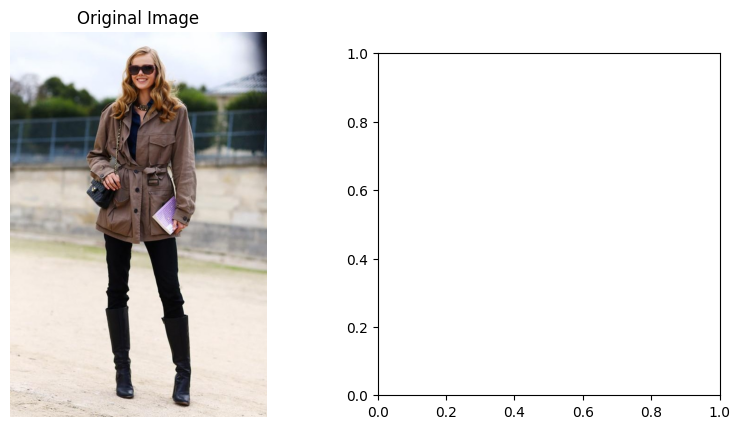

In [11]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def visualize_results(image_path, mask_path, model):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    results = model(image_path)
    if results[0].masks is not None:
        pred_mask = results[0].masks.data[0].cpu().numpy()
        pred_mask = (pred_mask * 255).astype(np.uint8)
    else:
        pred_mask = np.zeros_like(gt_mask)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap="jet")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(gt_mask, cmap="jet")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.show()

val_images_dir = os.path.join(dataset_path, "images", "val")
val_masks_dir = os.path.join(dataset_path, "labels", "val")
val_images = sorted(os.listdir(val_images_dir))
val_masks = sorted(os.listdir(val_masks_dir))

for i in range(5):
    image_path = os.path.join(val_images_dir, val_images[i])
    mask_path = os.path.join(val_masks_dir, val_masks[i])
    visualize_results(image_path, mask_path, model1)